#CIS545 Final Project - FIFA Dataset Analysis

*By Vishaal, Jeffrey, and Vikram*

**Project Idea**

FIFA is titled as the best-selling sports video game franchise in the world. Football and players are obsessed with the game. Every year, fans are eager to know what the ratings of their favorite players are for the next iteration of FIFA. Oftentimes Electronic Arts (EA), the creators of FIFA, are questioned for their rating decisions and there is a lot of debate in the football community about the validity of these player ratings. We thought it would be interesting to analyze the player ratings, and team statistics in order to see some trends in the way EA rates football players. It would be interesting to visualize the similarities and differences among leagues, clubs, and national teams.  We could answer some of football’s most debated questions:

Does your transfer value depend on the league you play in?

Which domestic league is the most competitive (player rating wise)

And so much more!
		
**Here's the coolest part of this project**, using this data analysis, we we can create a market value predictor - Depending on the different attributes/traits of the custom player, this predictor would estimate the market value of a player, as well as their salary. We've merged out player statistical data with WAGE and TRANSFER VALUE data that will allow us to perform supervised machine learning.


**Useful Links Related to this Project**


Dataset Source: https://sofifa.com and https://www.kaggle.com/bryanb/fifa-player-stats-database?select=FIFA17_official_data.csv

How Fifa Ratings are Calculated: https://www.earlygame.com/fifa/fifa-ratings-explained-overall-rating/

**Please navigate our project using the table of contents!**


# Section 0: Medium Article

We've written a Medium article detailing our journey to demystifying the FIFA algorithm [here](https://medium.com/@vishaalkumar_21306/e391bce93ec9)!

# Section 1: Data Parsing, Cleaning, Structuring, and Integration

We first merge the data from Kaggle with additional wage/salary data scraped from sofifa.com. The Kaggle database was also scraped from this website, but in order to avoid having to scrape everything ourselves, we just scraped the extra data we needed and joined it with the Kaggle csvs for the years 2017-2022.

# The Goal
We want to create a list of dataframes named "fifa_df_list"
This list should contain 6 dataframe entries from year 2017-2022 that contain the additional data, are cleaned, and structured for EDA to begin.





# *HOW TO PREPARE DATA FOR EDA/Modeling. 
Code has been commented so you can click "run all" and it will work without rescraping data from wikipedia!*

##1.1 Setup of Dataframes

In [ ]:
!pip install requests
!pip install wikipedia

In [ ]:
import pandas as pd
from google.colab import drive
import requests
from bs4 import BeautifulSoup
import seaborn as sns
import re

import requests
from lxml import html
import math
import csv
import wikipedia

In [ ]:
#Make sure that you have the following path in your drive: /content/drive/My Drive/CIS545 Final Project/
drive.mount("/content/drive/")

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


Data Setup and Google Drive Connection

In [ ]:
#Initialize Fifa Dataframes for years 2017 - 2022
fifa22_df = pd.read_csv('/content/drive/My Drive/CIS545 Final Project/Data/FIFA22_official_data.csv')
fifa21_df = pd.read_csv('/content/drive/My Drive/CIS545 Final Project/Data/FIFA21_official_data.csv')
fifa20_df = pd.read_csv('/content/drive/My Drive/CIS545 Final Project/Data/FIFA20_official_data.csv')
fifa19_df = pd.read_csv('/content/drive/My Drive/CIS545 Final Project/Data/FIFA19_official_data.csv')
fifa18_df = pd.read_csv('/content/drive/My Drive/CIS545 Final Project/Data/FIFA18_official_data.csv')
fifa17_df = pd.read_csv('/content/drive/My Drive/CIS545 Final Project/Data/FIFA17_official_data.csv')
fifa_df_list = [fifa17_df, fifa18_df, fifa19_df, fifa20_df, fifa21_df, fifa22_df]

## Integration of Additional Data

Information mapping from Club to League fetched from Wikipedia

###1.1.1 Single Threaded Lookup from Wikipedia

In [ ]:
'''
Single-thread processing
'''
club_to_league = {}
no_match = set()
league_path = "//table[@class=\"infobox vcard\"]/tbody/tr[th=\"League\"]/td/a/text()"
names_of_fifa_df = ["fifa17_df", "fifa18_df", "fifa19_df", "fifa20_df", "fifa21_df", "fifa22_df"]
for i, fifa_df in enumerate(fifa_df_list):
  print("Processing %s" % names_of_fifa_df[i])
  for club in fifa_df['Club']:
    if not isinstance(club, str):
      # Found NaN (no club for player) or non-string
      continue
    if club in team_to_league or club in no_match:
      # Already seen
      continue

    # First time seeing this club, find league if possible
    w = requests.get("https://en.wikipedia.org/wiki/%s" % club.replace(" ", "_"))
    dom_tree = html.fromstring(w.content)
    res = dom_tree.xpath(league_path)

    if not res:
      # No match found
      # Possibly due to multiple website matches/references or different schema
      no_match.add(club)
    else:
      # Found matching league
      # ASSUMPTION: each club only falls under 1 league and clubs don't change leagues
      team_to_league[club] = res[0]

'\nSingle-thread processing\n'

###1.1.2 Direct Match From Wikipedia with Multithreading

In [ ]:
'''
DIRECT MATCH SEARCH

- Searches for League from Wikipedia page based on team name
- Limited to direct match (does not work for diambiguation pages)

Results:
Num clubs found: 684
No matches found: 201
'''
club_to_league_direct = {}
no_match_direct = set()
league_path = "//table[@class=\"infobox vcard\"]/tbody/tr[th=\"League\"]/td/a/text()"
names_of_fifa_df = ["fifa17_df", "fifa18_df", "fifa19_df", "fifa20_df", "fifa21_df", "fifa22_df"]

def update_club(club):
  if not isinstance(club, str):
    # Found NaN (no club for player) or non-string
    return club
  if club in club_to_league_direct or club in no_match_direct:
    # Already seen
    return club

  # First time seeing this club, find league if possible
  w = requests.get("https://en.wikipedia.org/wiki/%s" % club.replace(" ", "_"))
  dom_tree = html.fromstring(w.content)
  res = dom_tree.xpath(league_path)
  if not res:
    # No match found
    # Possibly due to multiple website matches/references or different schema
    no_match_direct.add(club)
  else:
    # Found matching league
    # ASSUMPTION: each club only falls under 1 league and clubs don't change leagues
    club_to_league_direct[club] = res[0]
  return club

for i, fifa_df in enumerate(fifa_df_list):
  print("Processing %s" % names_of_fifa_df[i])
  fifa_df['Club'].apply(update_club)

print(club_to_league_direct)
print("Num clubs found: %d" % len(club_to_league_direct))
print(no_match_direct)
print("No matches found: %d" % len(no_match_direct))

'\nDIRECT MATCH SEARCH\n\n- Searches for League from Wikipedia page based on team name\n- Limited to direct match (does not work for diambiguation pages)\n\nResults:\nNum clubs found: 684\nNo matches found: 201\n'

In [ ]:
with open('club_to_league_direct.csv', mode='w') as club_to_league_direct_file:
  club_to_league_direct_writer = csv.writer(club_to_league_direct_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
  for club, league in club_to_league_direct.items():
    club_to_league_direct_writer.writerow([club, league])
with open('no_match_direct.csv', mode='w') as no_match_direct_file:
  no_match_direct_writer = csv.writer(no_match_direct_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
  for club in no_match_direct:
    no_match_direct_writer.writerow([club])

###1.1.3 Depth Search From Wikipedia Multithreaded

This is the method we ultimtely ended up choosing, as it allowed for the fewest amount of teams with no match, by using the depth search principle to get past Wikipedia's disambiguation pages. 

In [ ]:
# '''
# WIKIPEDIA-DEPTH BASED SEARCH APPROACH

# Updated attempt:
#  - Utilizes wikipedia package/api to fetch top N most relevant results for club name (tunable N parameter)
#  - Iterate through each of the relevant results, check to see if there is a matching league (likely means that the page is a football club)
#   - If none have a league, then give up and no match
#   - If one has a league match, stop and record. Skip the rest of the results

# Some notes:
#  - N is a tunable parameter (currently set to 5). Increasing N will drastically increase time of runtime, but may lead to more matches (no difference up to a certain point though)
#   - N=5 generally runs for ~2 mins
#     - Results: 1001 matches, 36 no matches
#   - Runs for approximately 2-3 minutes
# '''
club_to_league_depth = {}
no_match_depth = set()
league_path = "//table[@class=\"infobox vcard\"]/tbody/tr[th=\"League\"]/td/a/text()"
names_of_fifa_df = ["fifa17_df", "fifa18_df", "fifa19_df", "fifa20_df", "fifa21_df", "fifa22_df"]
depth = 5

def update_club(club):
  if not isinstance(club, str):
    # Found NaN (no club for player) or non-string
    return club
  if club in club_to_league_depth or club in no_match_depth:
    # Already seen
    return club
  for name in wikipedia.search(club, results=depth):
    # First time seeing this club, find league if possible
    w = requests.get("https://en.wikipedia.org/wiki/%s" % name.replace(" ", "_"))
    dom_tree = html.fromstring(w.content)
    res = dom_tree.xpath(league_path)
    if res:
      # Found matching league
      # ASSUMPTION: each club only falls under 1 league and clubs don't change leagues
      club_to_league_depth[club] = res[0]
      return club
  # No match found
  # Possibly due to multiple website matches/references or different schema
  no_match_depth.add(club)
  return club

for i, fifa_df in enumerate(fifa_df_list):
  # print("Processing %s DISABLED, UNCOMMENT LINE BELOW TO REENABLE" % names_of_fifa_df[i])
  fifa_df['Club'].apply(update_club)

print(club_to_league_depth)
print("Num clubs found: %d" % len(club_to_league_depth))
print(no_match_depth)
print("No matches found: %d" % len(no_match_depth))

{'FC Barcelona': 'La Liga', 'Roma': 'Serie A', 'FC Bayern München': 'Bundesliga', 'Manchester United': 'Premier League', 'Real Madrid': 'La Liga', 'Everton': 'Premier League', 'Juventus': 'Serie A', 'Shakhtar Donetsk': 'Ukrainian Premier League', 'AS Monaco': 'Ligue 1', 'VfL Wolfsburg': 'Bundesliga', 'Milan': 'Serie A', 'Olympique de Marseille': 'Ligue 1', 'Olympique Lyonnais': 'Ligue 1', 'Beşiktaş JK': 'Süper Lig', 'Manchester City': 'Premier League', 'Liverpool': 'Premier League', 'FC Rostov': 'Russian Premier League', 'Tottenham Hotspur': 'Premier League', 'Sporting CP': 'Primeira Liga', 'Arsenal': 'Premier League', 'Paris Saint-Germain': 'Ligue 1', 'Napoli': 'Serie A', 'FC Schalke 04': '2. Bundesliga', 'OGC Nice': 'Ligue 1', 'SL Benfica': 'Primeira Liga', 'Borussia Dortmund': 'Bundesliga', 'UD Las Palmas': 'Segunda División', 'FC Porto': 'Primeira Liga', 'Lazio': 'Serie A', 'Borussia Mönchengladbach': 'Bundesliga', 'PFC CSKA Moscow': 'Russian Premier League', 'Chievo Verona': 'Seri

In [ ]:
with open('club_to_league_depth_%d.csv' % depth, mode='w') as club_to_league_depth_file:
  club_to_league_depth_writer = csv.writer(club_to_league_depth_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
  for club, league in club_to_league_depth.items():
    club_to_league_depth_writer.writerow([club, league])
with open('no_match_depth_%d.csv' % depth, mode='w') as no_match_depth_file:
  no_match_depth_writer = csv.writer(no_match_depth_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
  for club in no_match_depth:
    no_match_depth_writer.writerow([club])

In [ ]:
club_to_league_depth_5 = pd.read_csv('/content/drive/My Drive/CIS545 Final Project/Data/club_to_league_depth_5.csv', names=['Club','League'])
no_match_depth_5 = pd.read_csv('/content/drive/My Drive/CIS545 Final Project/Data/no_match_depth_5.csv', names=['Club'])

In [ ]:
'''
MERGE FIFA DATAFRAMES WITH LEAGUE DATA
- swaps 'Club Logo' and 'League' columns for easier reading
'''
def swap_columns(df, colA, colB):
  cols = list(df.columns)
  a, b = cols.index('League'), cols.index('Club Logo')
  cols[b], cols[a] = cols[a], cols[b]
  return df[cols]
fifa_df_list = [swap_columns(fifa_df.merge(club_to_league_depth_5, how='inner', left_on='Club', right_on='Club'), 'League', 'Club Logo') for fifa_df in fifa_df_list]

##1.2 Cleaning the Data

###1.2.1 Cleaning the Position Column

The position column currently has a <span> tag containing the content that we need to extract.

In [ ]:
def clean_position(position):
  if isinstance(position, str):
    cleaned_position = re.sub('<[^<]+?>', '', position)
  else:
    cleaned_position = None
  return cleaned_position

###1.2.2 Cleaning the Wages

In [ ]:
def clean_wages(value):
  if value:
    value = str(value[1:])
    value.replace(',', '')
    multiplier = (len(value) > 0 and value[-1] == 'K')
    try:
      wage = float(value) if not multiplier else float(value[:-1]) * 1000
    except:
      wage = None
  else:
    wage = None
  return wage

###1.2.3 Cleaning the Transfer Values

*   Replace K by multiplying by 1000
*   Replace M by multiplying by 1000000
*   Replace B by multiplying by 1000000000


In [ ]:
def clean_value(value):
  if value:
    value = str(value[1:])
    value.replace(',', '')
    multiplier = len(value) > 0 and (value[-1] == 'K' or value[-1] == 'M' or value[-1] == 'B')
    mult_val = 1
    if multiplier:
      if value[-1] == 'K':
        mult_val = 1000
      elif value[-1] == 'M':
        mult_val = 1000000
      elif value[-1] == 'B':
        mult_val = 1000000000
    try:
      cleaned_value = float(value) if not multiplier else float(value[:-1]) * mult_val
    except:
      cleaned_value = None
  else:
    cleaned_value = None
  return cleaned_value

###1.2.3 Removing the Unnecessary Columns
We chose the drop the following columns: ['Flag', 'Loaned From', 'Joined', 'Release Clause', 'Photo', 'Club Logo', 'Special', 'Real Face', 'Marking', 'GKHandling', 'GKDiving', 'GKKicking', 'GKPositioning', 'GKReflexes']

We also call all of the other clean data functions prior defined here

In [ ]:
def drop_columns(df):
  columns_to_drop = ['Flag', 'Loaned From', 'Joined', 'Release Clause', 'Photo', 'Club Logo', 'Special', 'Real Face', 'Marking', 'GKHandling', 'GKDiving', 'GKKicking', 'GKPositioning', 'GKReflexes']
  for col in columns_to_drop:
    if col in df:
      df = df.drop(labels=[col], axis=1)
  return df



###1.2.4 Cleaning NaN/Null Types

Drop Na in all columns





In [ ]:
def drop_na(df):
  return df.dropna() 

###1.2.5 Cleaning the Height Column

Convert all heights to float type values (feet+inches OR cm to cm)
 

In [ ]:
def clean_height(x):
  if isinstance(x, str):
    if x[-2:] == 'cm':
      # cm
      return float(x[0:-2])
    else: 
      # feet+inches
      vals = x.split('\'')
      return 2.54 * (int(vals[0]) * 12 + int(vals[1]))
  return 0.0

###1.2.6 Cleaning the Weight Column

Convert all weights to float type values (lbs OR kg to kg)
 

In [ ]:
def clean_weight(x):
  if isinstance(x, str):
    if x[-2:] == 'kg':
      # kg
      return float(1.0 * float(x[0:-2]))
    else:
      # lbs
      return float(0.45359237 * float(x[0:-3]))
  return 0.0

###1.2.7 Cleaning the Body Type Column

Removing the values in parenthesis

In [ ]:
def clean_body_type(x):
  if isinstance(x, str):
    return re.sub("[\(\[].*?[\)\]]", "", x).strip()
  else:
    return x

##1.3 Call This to Prepare Data for EDA

Calls all cleaning functions on the dataframes in fifa_df_list

In [ ]:
def clean_df(df):
  num_rows = len(df)
  df = drop_columns(df)
  df = df.astype({'Position': str, 'Body Type': str})
  df['Position'] = df['Position'].apply(lambda x : clean_position(x))
  df['Wage'] = df['Wage'].apply(lambda x : clean_wages(x))
  df['Value'] = df['Value'].apply(lambda x : clean_value(x))
  df['Height'] = df['Height'].apply(lambda x : clean_height(x))
  df['Weight'] = df['Weight'].apply(lambda x : clean_weight(x))
  df['Body Type'] = df['Body Type'].apply(lambda x : clean_body_type(x))
  df = df.astype({'Wage': float, 'Value': float})
  df = drop_na(df)

  print("BEFORE CLEANING had {} rows, AFTER CLEANING: has {} rows".format(num_rows, len(df)))
  return df

In [ ]:
fifa_df_list = [clean_df(f) for f in fifa_df_list]

BEFORE CLEANING had 17031 rows, AFTER CLEANING: has 16915 rows
BEFORE CLEANING had 17415 rows, AFTER CLEANING: has 17288 rows
BEFORE CLEANING had 17425 rows, AFTER CLEANING: has 17296 rows
BEFORE CLEANING had 16486 rows, AFTER CLEANING: has 14756 rows
BEFORE CLEANING had 16610 rows, AFTER CLEANING: has 15572 rows
BEFORE CLEANING had 16230 rows, AFTER CLEANING: has 15306 rows


#Section 2: Exploratory Data Analysis

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

## 2.0 Attributes

In [ ]:
# Only list the attributes we care about
attributes = [
 'Crossing',
 'Finishing',
 'Dribbling',
 'BallControl',
 'Acceleration',
 'SprintSpeed',
 'Agility',
 'Balance',
 'ShotPower',
 'Stamina',
 'Strength',
 'Vision']

##2.1 Correlation Matrix

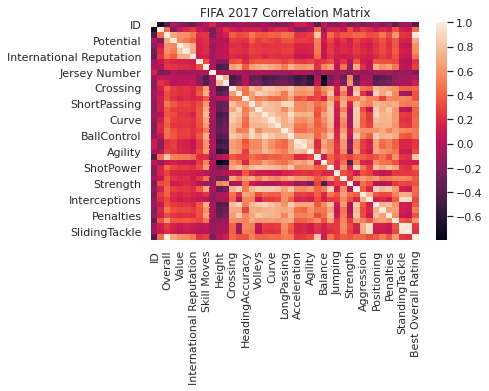

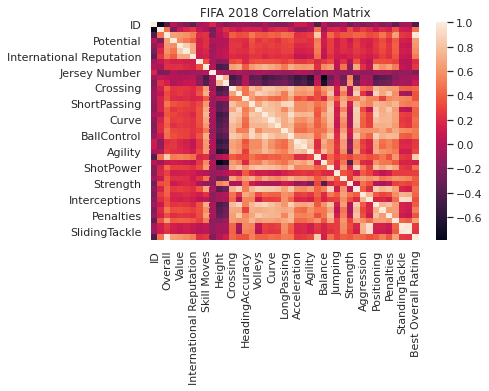

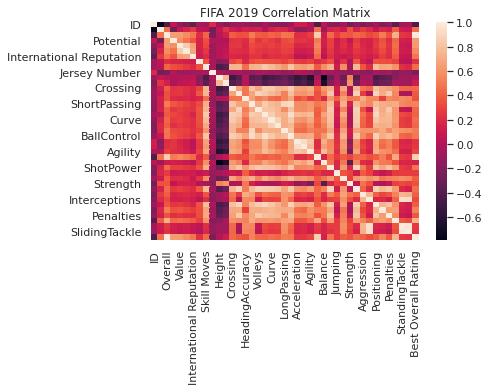

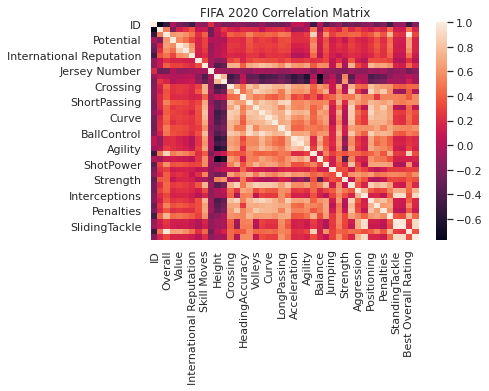

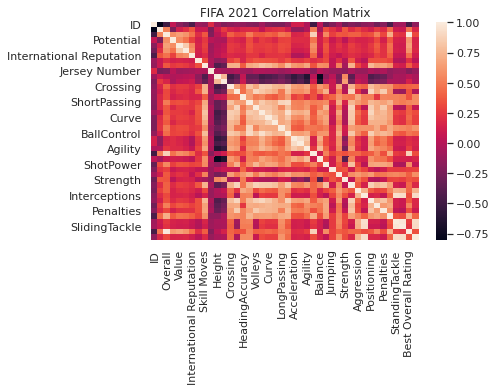

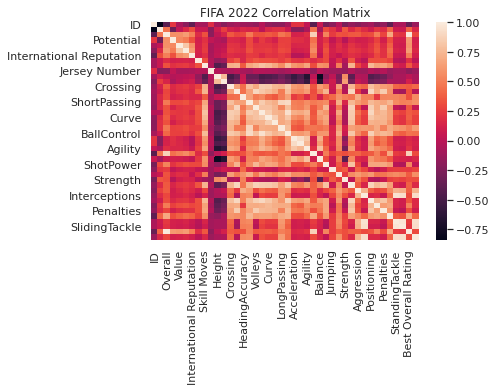

In [ ]:
#Correlation Matrix on Fifa 17-22 Data
def corr_maps(year):
  sns.set_theme(style="white")
  fifa_17_df = fifa_df_list[year - 2017]
  corr = fifa_17_df.corr()
  sns.heatmap(corr)
  plt.title('FIFA ' + str(2017 + i ) + ' Correlation Matrix')

for i in range(0, 6):
  corr_maps(2017 + i)
  plt.show()

##2.2 Overall Rating vs Age Histogram

Year 2017, Most # of players centered at same bin = 576.0, Age = 26, Overall = 55
Year 2018, Most # of players centered at same bin = 506.0, Age = 24, Overall = 52
Year 2019, Most # of players centered at same bin = 528.0, Age = 22, Overall = 52
Year 2020, Most # of players centered at same bin = 520.0, Age = 26, Overall = 49
Year 2021, Most # of players centered at same bin = 597.0, Age = 26, Overall = 49
Year 2022, Most # of players centered at same bin = 524.0, Age = 22, Overall = 46


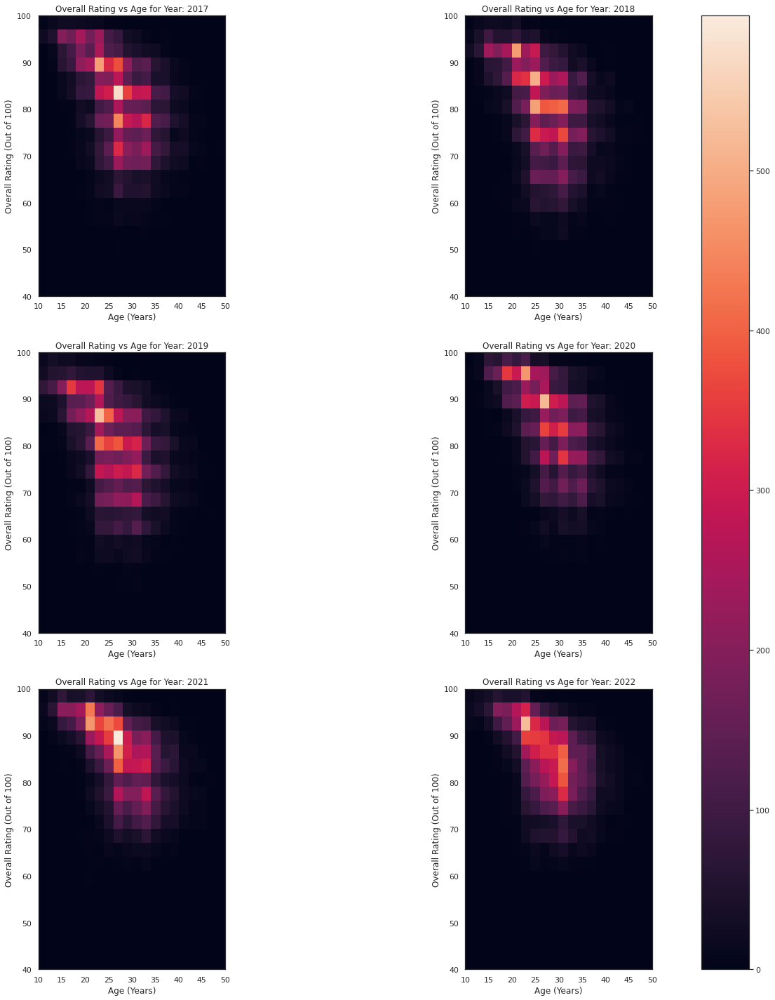

In [ ]:
#Overall Rating vs Age
def overall_vs_age():
  mappables=[]
  ctr = 0
  fig, axes_list = plt.subplots(3, 2, figsize=(25,25))
  for axes_tup in axes_list:
    for axes in axes_tup:
      H,xedges,yedges = np.histogram2d(fifa_df_list[ctr]["Age"], fifa_df_list[ctr]["Overall"], bins=20)
      mappables.append(H)
      axes.set_title('Overall Rating vs Age for Year: {}'.format(ctr + 2017))
      axes.set_xlabel("Age (Years)")
      axes.set_ylabel("Overall Rating (Out of 100)")
      ctr += 1

  vmin = np.min(mappables)
  vmax = np.max(mappables)

  for ax,H in zip(axes_list.ravel(),mappables):
    im = ax.imshow(H,vmin=vmin, vmax=vmax, extent=[10, 50, 40, 100])

  fig.colorbar(im,ax=axes_list.ravel())

  ctr = 0
  for H in mappables:
    year_max = np.unravel_index(H.argmax(), H.shape)
    print("Year {}, Most # of players centered at same bin = {}, Age = {}, Overall = {}".format(ctr + 2017, H[year_max[0], year_max[1]], year_max[1]*2 + 10, year_max[0]*3 + 40))
    ctr += 1

overall_vs_age()

##2.3 Overall Average Rating vs League

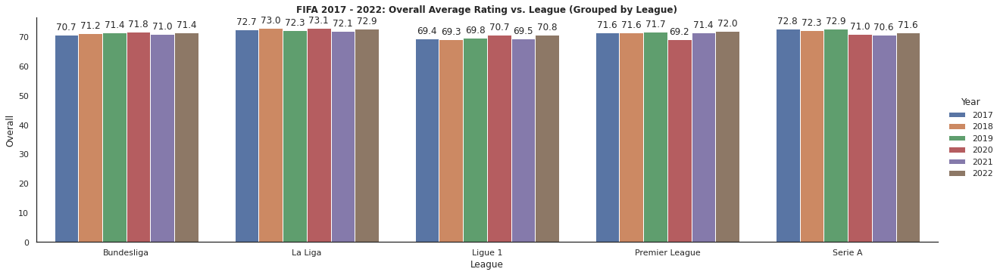

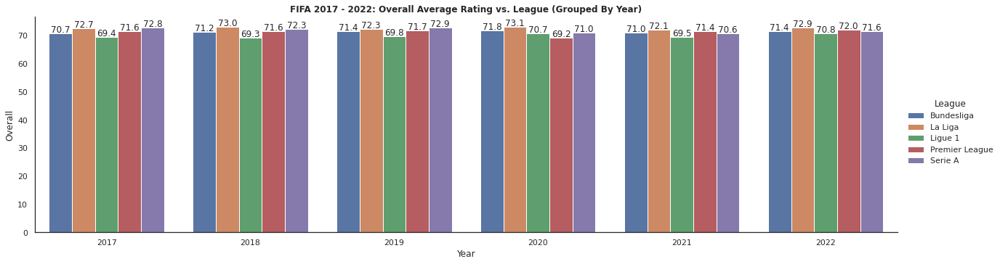

In [ ]:
'''
Overall vs. League
'''
import math 
import matplotlib.pyplot as pyplot

names_of_fifa_df = ["fifa17_df", "fifa18_df", "fifa19_df", "fifa20_df", "fifa21_df", "fifa22_df"]
# Set to positive number to limit results, <= 0 to show all
num_teams = 10
europe_big_five = ['Premier League', 'Bundesliga', 'La Liga', 'Serie A', 'Ligue 1']
show_grouped = True
def overall_vs_league(field, sg):
  all_years = fifa_df_list[0]
  for i, fifa_df in enumerate(fifa_df_list):
    grouped = pd.DataFrame(fifa_df.groupby('League').mean().reset_index())
    columns_to_keep = set(['League', 'Overall'])
    grouped = grouped[columns_to_keep]
    grouped.sort_values(by='Overall', ascending=False)
    grouped['Year'] = 2017 + i
    if isinstance(field, int) and num_teams > 0:
      # Number of (top) leagues to supplied
      grouped = grouped.head(num_teams)
    elif isinstance(field, list):
      # List of leagues supplied
      grouped = grouped.loc[grouped['League'].isin(field)]
    if sg and i == 0:
      all_years = grouped
    elif sg:
      all_years = all_years.append(grouped)
  
    if not sg:
      plt.figure(figsize=(10, 5))
      splot = sns.barplot(data=grouped, x='League', y='Overall')
      plt.title('FIFA ' + str(2017 + i) + ': Overall Average Rating vs. League', fontdict={'fontweight': 'bold'})
      for p in splot.patches:
          splot.annotate(format(p.get_height(), '.1f'), 
                        (p.get_x() + p.get_width() / 2., p.get_height()), 
                        ha = 'center', va = 'center', 
                        xytext = (0, 5), 
                        textcoords = 'offset points')
      plt.show()
  if sg:
    all_years = all_years.reset_index()
    splot = sns.catplot(x='League', y='Overall', hue='Year', data=all_years, kind='bar', height=5, aspect=3.5)
    plt.title('FIFA 2017 - 2022: Overall Average Rating vs. League (Grouped by League)', fontdict={'fontweight': 'bold'})
    for ax in splot.axes.ravel():
      for p in ax.patches:
        ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

    splot = sns.catplot(x='Year', y='Overall', hue='League', data=all_years, kind='bar', height=5, aspect=3.5)
    plt.title('FIFA 2017 - 2022: Overall Average Rating vs. League (Grouped By Year)', fontdict={'fontweight': 'bold'})
    for ax in splot.axes.ravel():
      for p in ax.patches:
        ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

overall_vs_league(europe_big_five, show_grouped)


##2.4 Height vs Attributes

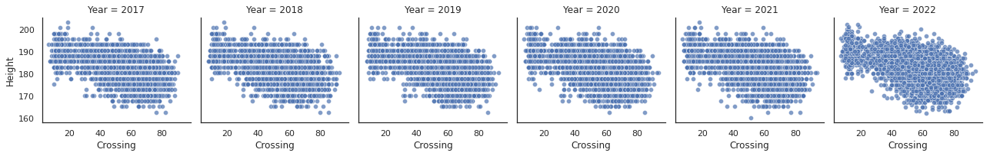

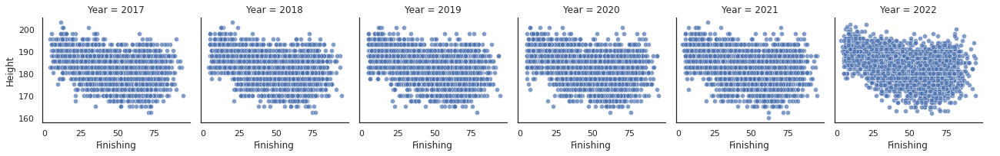

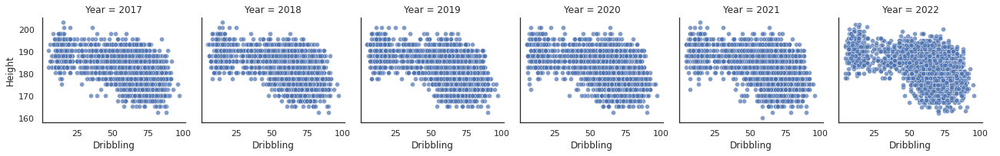

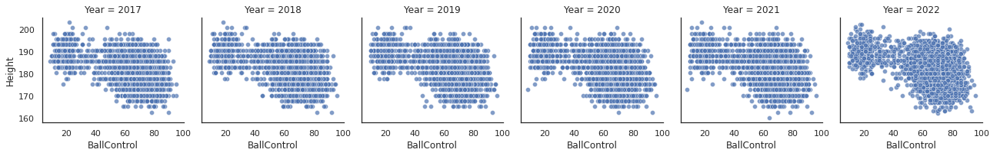

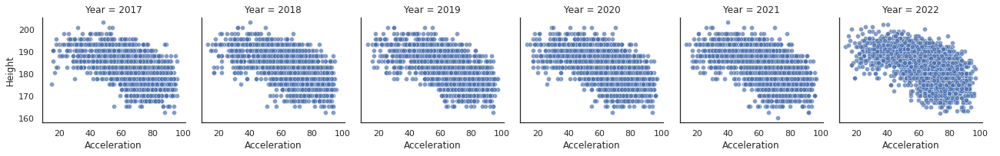

...

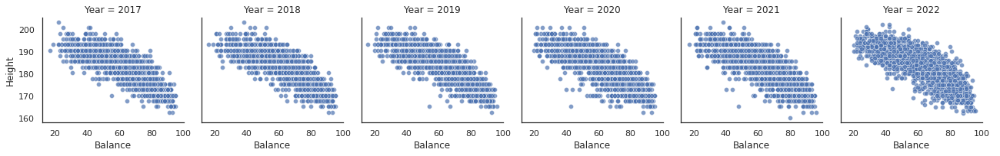

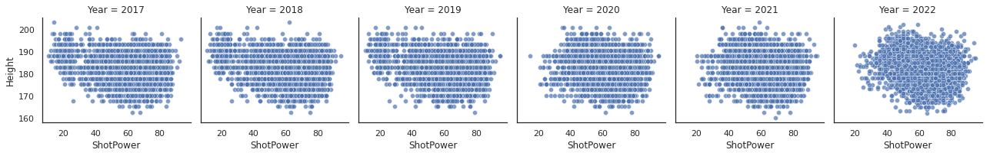

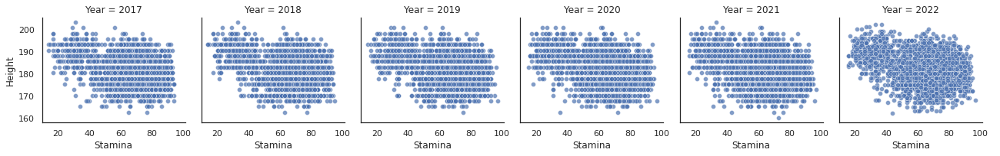

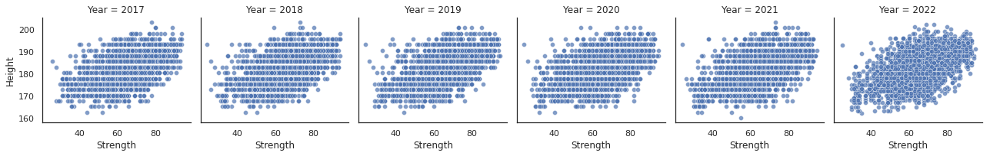

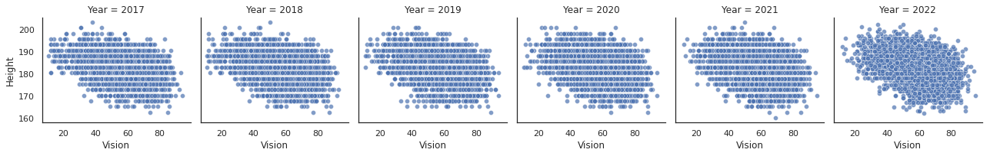

In [ ]:
num_teams = 10
europe_big_five = ['Premier League', 'Bundesliga', 'La Liga', 'Serie A', 'Ligue 1']
def height_vs_attributes(fields, sg):
  for attribute in attributes:
    all_years = fifa_df_list[0]
    for i, fifa_df in enumerate(fifa_df_list):
      if not sg:
        filtered = fifa_df.loc[fifa_df['League'].isin(fields)]
        plt.scatter(list(filtered['Height']), list(filtered[attribute]))
        plt.title("'Height vs. {}' for {}".format(attribute.title(), names_of_fifa_df[i]))
        plt.xlabel("Height (cm)")
        plt.ylabel("{}".format(attribute.title()))
        plt.show()
      else:
        filtered = fifa_df.loc[fifa_df['League'].isin(fields)]
        filtered = filtered[set([attribute, 'Height'])]
        filtered['Year'] = 2017 + i
        if i == 0:
          all_years = filtered
        else:
          all_years = all_years.append(filtered)
    g = sns.FacetGrid(all_years, col='Year')
    g.map(sns.scatterplot, attribute, "Height", alpha=.7)
    g.add_legend()

height_vs_attributes(europe_big_five, True)

##2.5 Weight vs Attributes

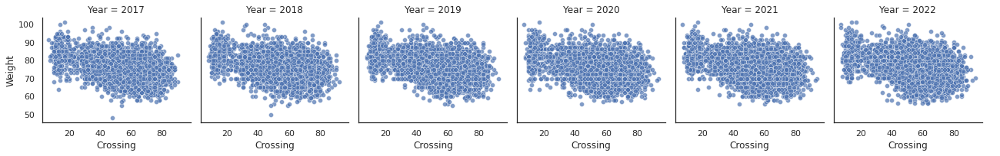

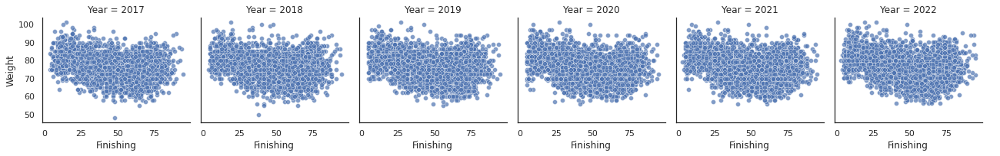

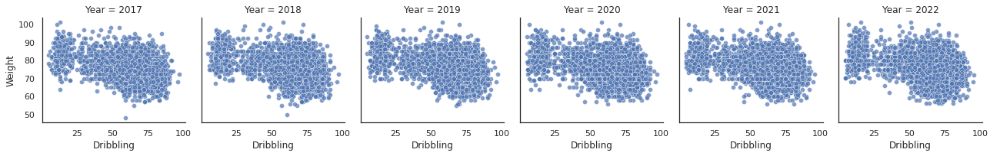

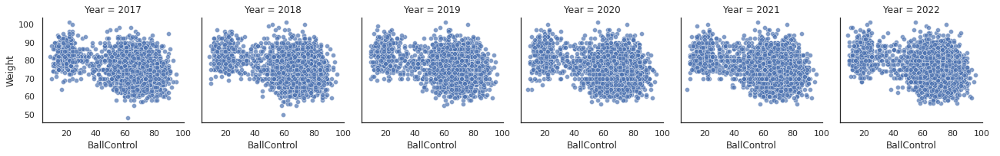

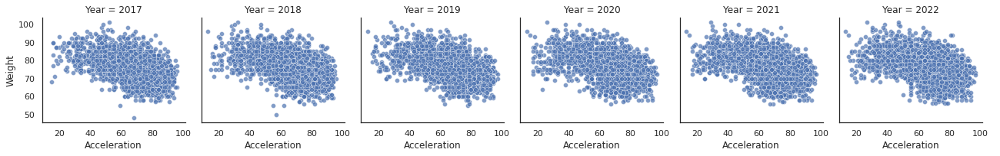

...

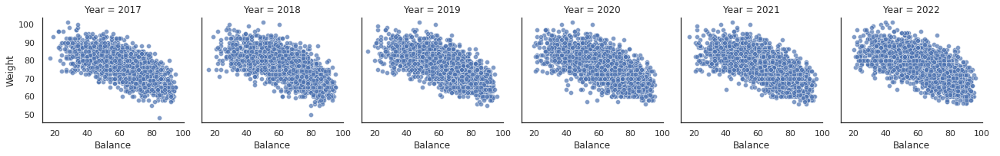

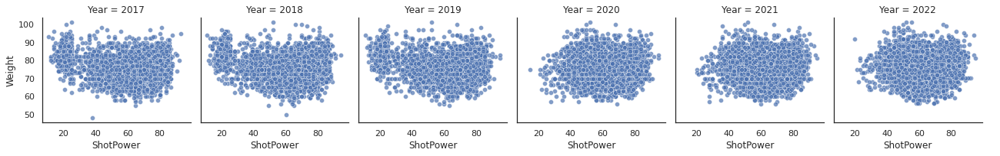

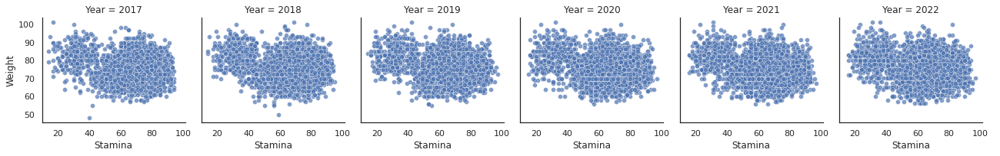

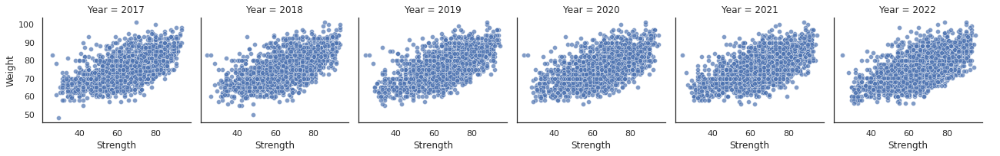

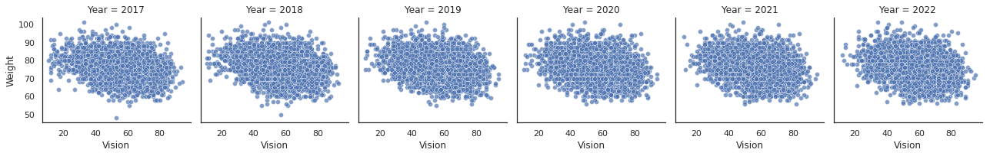

In [ ]:
num_teams = 10
europe_big_five = ['Premier League', 'Bundesliga', 'La Liga', 'Serie A', 'Ligue 1']
def weight_vs_attributes(fields, sg):
  for attribute in attributes:
    all_years = fifa_df_list[0]
    for i, fifa_df in enumerate(fifa_df_list):
      if not sg:
        filtered = fifa_df.loc[fifa_df['League'].isin(fields)]
        plt.scatter(list(filtered['Weight']), list(filtered[attribute]))
        plt.title("'Weight vs. {}' for {}".format(attribute.title(), names_of_fifa_df[i]))
        plt.xlabel("Weight (kg)")
        plt.ylabel("{}".format(attribute.title()))
        plt.show()
      else:
        filtered = fifa_df.loc[fifa_df['League'].isin(fields)]
        filtered = filtered[set([attribute, 'Weight'])]
        filtered['Year'] = 2017 + i
        if i == 0:
          all_years = filtered
        else:
          all_years = all_years.append(filtered)
    if sg:
      g = sns.FacetGrid(all_years, col='Year')
      g.map(sns.scatterplot, attribute, "Weight", alpha=.7)
      g.add_legend()

weight_vs_attributes(europe_big_five, True)

##2.6 Pairplots of Attributes

Filtered to Europe

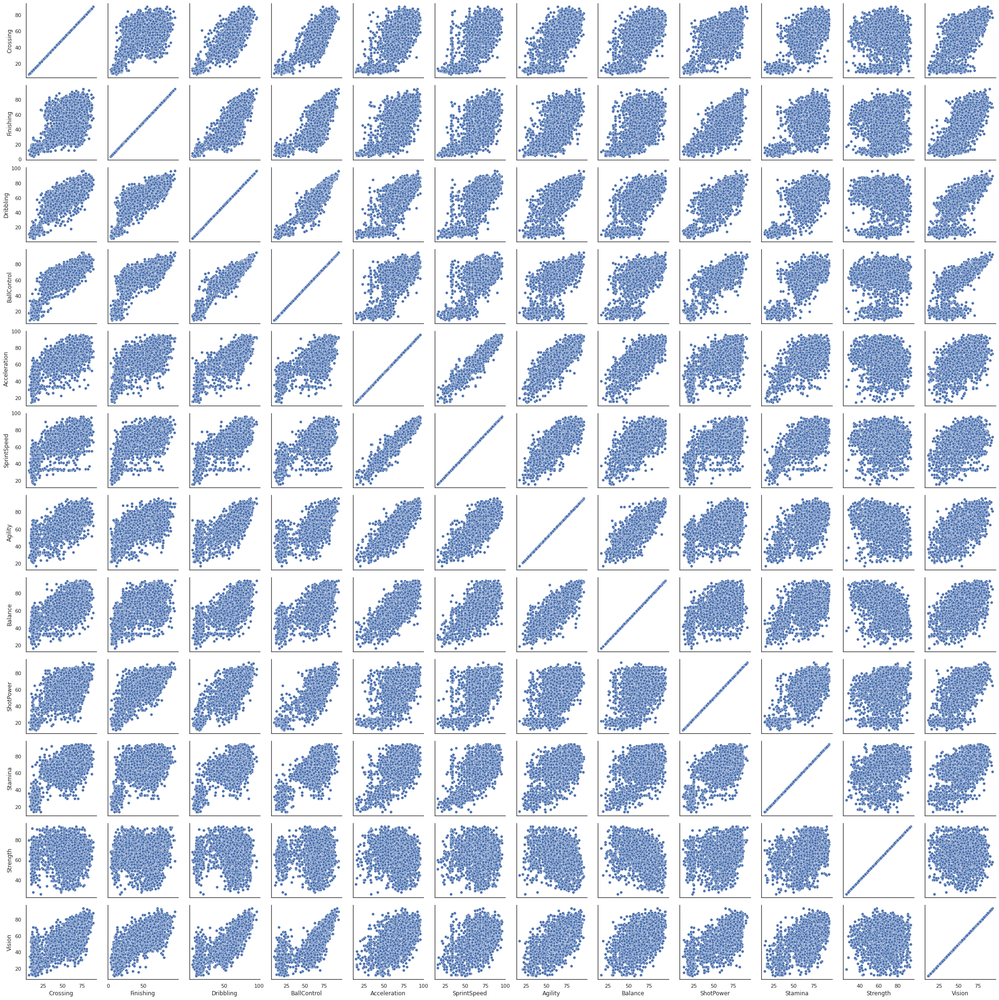

In [ ]:
europe_big_five = ['Premier League', 'Bundesliga', 'La Liga', 'Serie A', 'Ligue 1']
total = fifa_df_list[0]
total = total.loc[total['League'].isin(europe_big_five)][attributes]
for i, fifa_df in enumerate(fifa_df_list):
  if i == 0:
    continue
  filtered = fifa_df
  filtered = filtered.loc[filtered['League'].isin(europe_big_five)][attributes]
  total.append(filtered)
g = sns.PairGrid(total)
g.map(sns.scatterplot)

##2.7 Bodytypes

###2.7.1 Bodytypes in Each Year

In [ ]:
# Understanding the different body types in each game
for i, fifa_df in enumerate(fifa_df_list):
  print('--------' + 'For FIFA ' + str(2017 + i) + '-----------')
  print(fifa_df['Body Type'].value_counts())

--------For FIFA 2017-----------
Normal        10027
Lean           5776
Stocky         1106
Akinfenwa         1
Courtois          1
Messi             1
Shaqiri           1
C. Ronaldo        1
Neymar            1
Name: Body Type, dtype: int64
--------For FIFA 2018-----------
Normal        10076
Lean           6112
Stocky         1094
Akinfenwa         1
Courtois          1
Messi             1
Shaqiri           1
C. Ronaldo        1
Neymar            1
Name: Body Type, dtype: int64
--------For FIFA 2019-----------
Normal           9980
Lean             6255
Stocky           1054
Akinfenwa           1
Courtois            1
Messi               1
Shaqiri             1
C. Ronaldo          1
Neymar              1
Mohamed Salah       1
Name: Body Type, dtype: int64
--------For FIFA 2020-----------
Normal           8244
Lean             5666
Stocky            839
Akinfenwa           1
Courtois            1
Messi               1
Shaqiri             1
C. Ronaldo          1
Neymar              1


###2.7.2 Bodytypes in the Top Leages, in each year

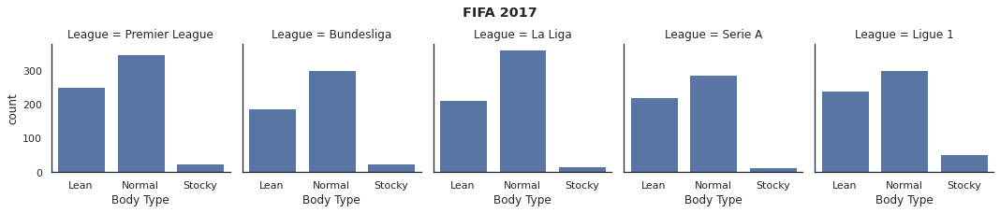

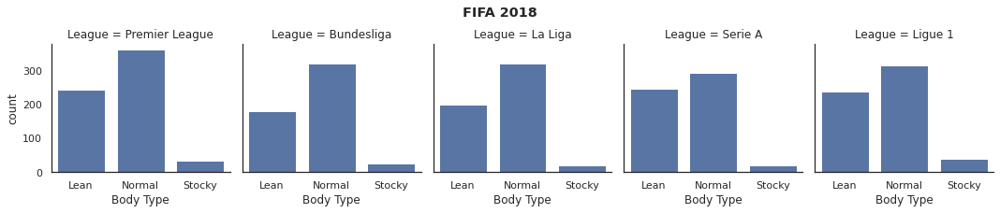

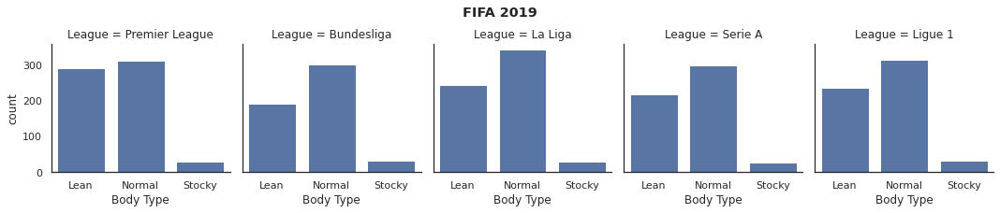

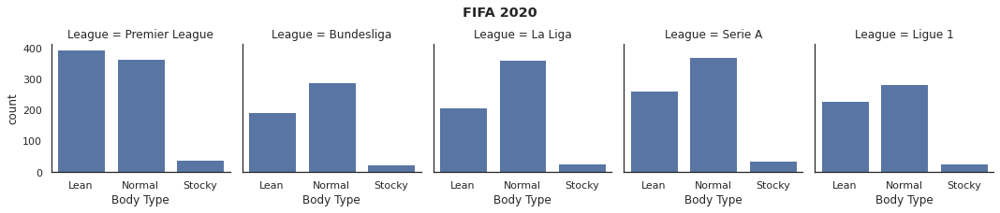

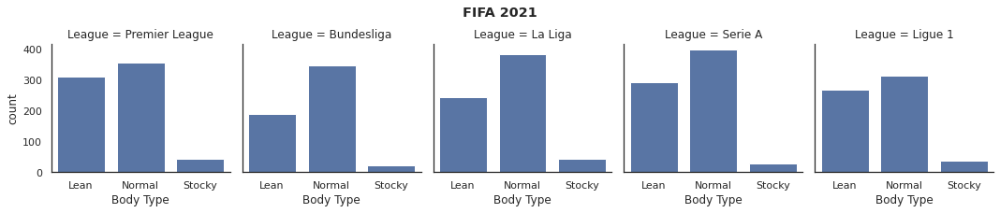

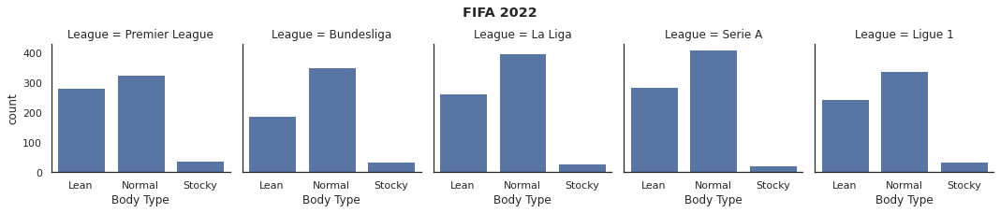

In [ ]:
def league_vs_bodytype():
  leagues = ['Premier League', 'Bundesliga', 'La Liga', 'Serie A', 'Ligue 1']
  body_types = ['Lean', 'Normal', 'Stocky']
  for i, fifa_df in enumerate(fifa_df_list):
    league_df = fifa_df[fifa_df['League'].isin(leagues) & fifa_df['Body Type'].isin(body_types)][['League', 'Body Type']]
    g = sns.FacetGrid(league_df, col="League", col_order=leagues)
    g.fig.suptitle('FIFA ' + str(2017 + i), y = 1.05, fontweight = 'bold')
    g.map(sns.countplot, "Body Type", order=body_types)
league_vs_bodytype()

##2.8 League vs Wage (Weekly Wage)

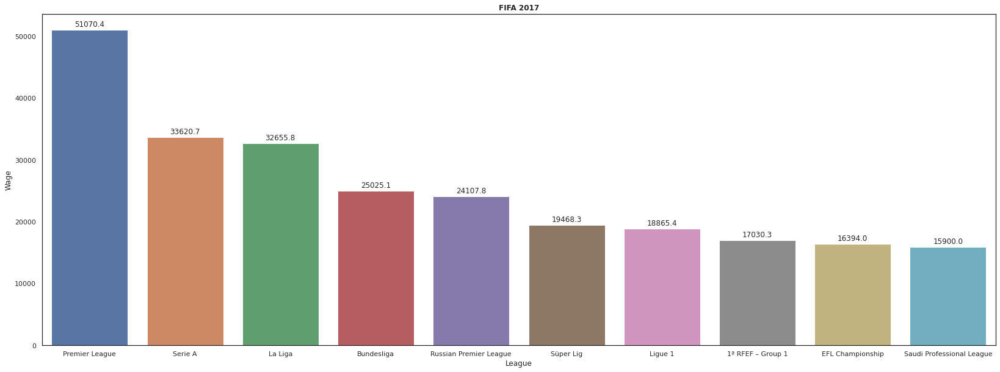

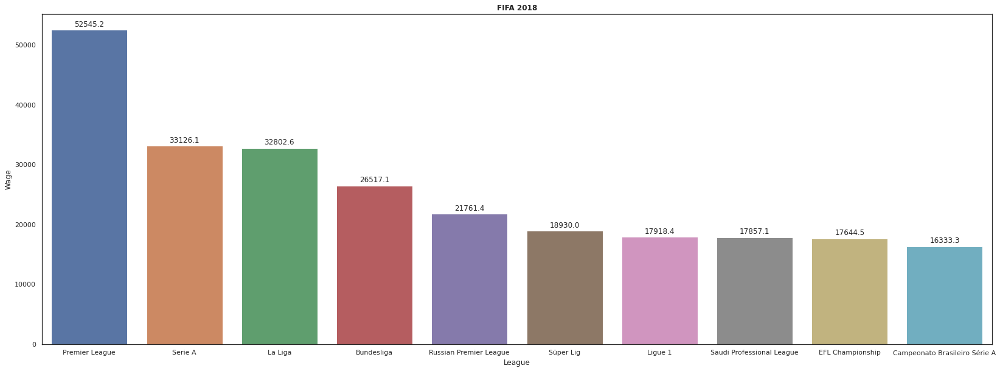

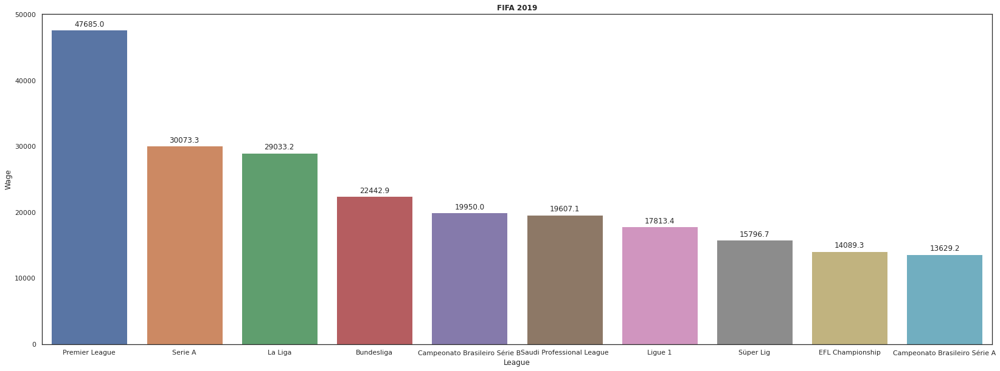

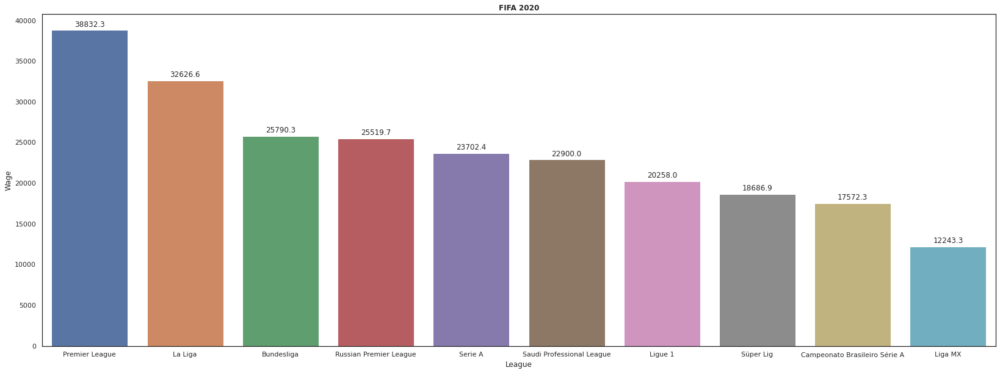

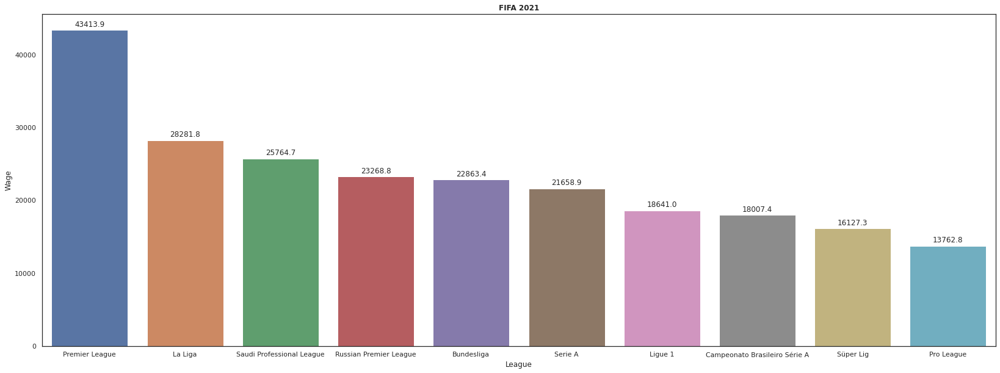

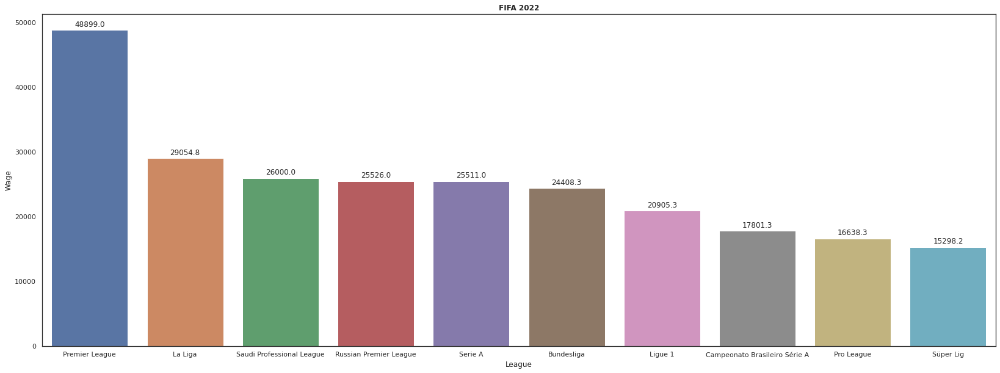

In [ ]:
# League vs Wage
def league_vs_wage():
  for i, fifa_df in enumerate(fifa_df_list):
    top_10_wage_df = fifa_df[['League', 'Wage']].groupby('League').mean().sort_values('Wage', ascending=False).reset_index().head(10)
    plt.figure(figsize=(28,10))
    splot = sns.barplot(data=top_10_wage_df, x='League', y='Wage')
    plt.title('FIFA ' + str(2017 + i), fontdict={'fontweight': 'bold'})
    for p in splot.patches:
        splot.annotate(format(p.get_height(), '.1f'), 
                      (p.get_x() + p.get_width() / 2., p.get_height()), 
                      ha = 'center', va = 'center', 
                      xytext = (0, 9), 
                      textcoords = 'offset points')
    plt.show()
league_vs_wage()


##2.9 Position vs Wage (Weekly Wage)

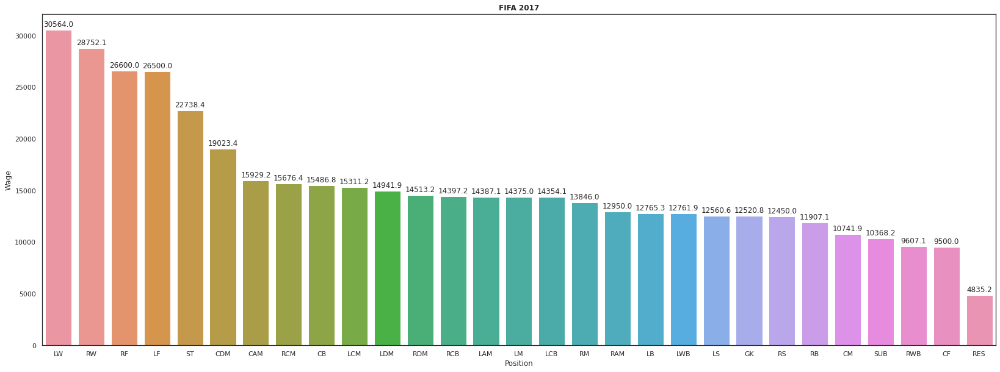

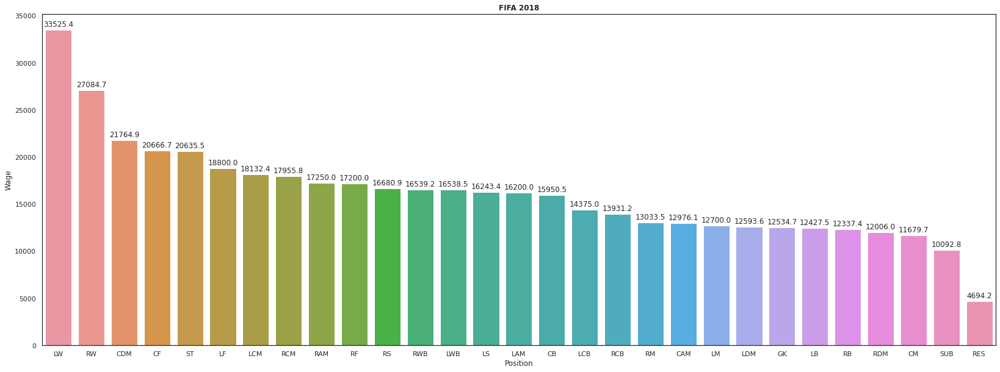

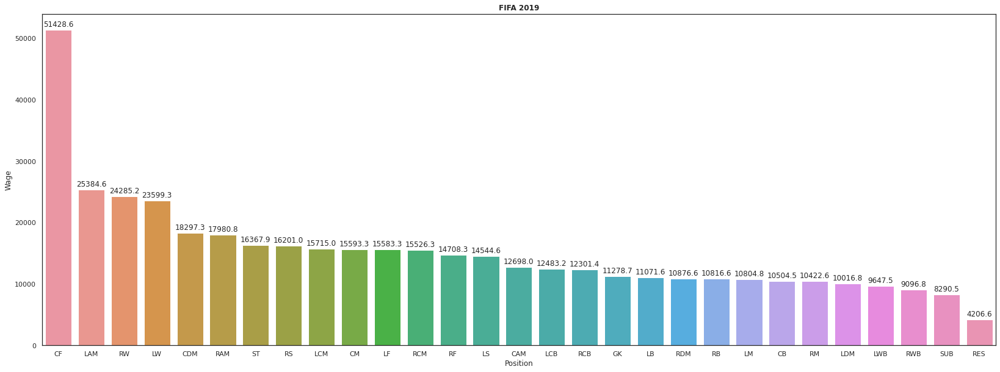

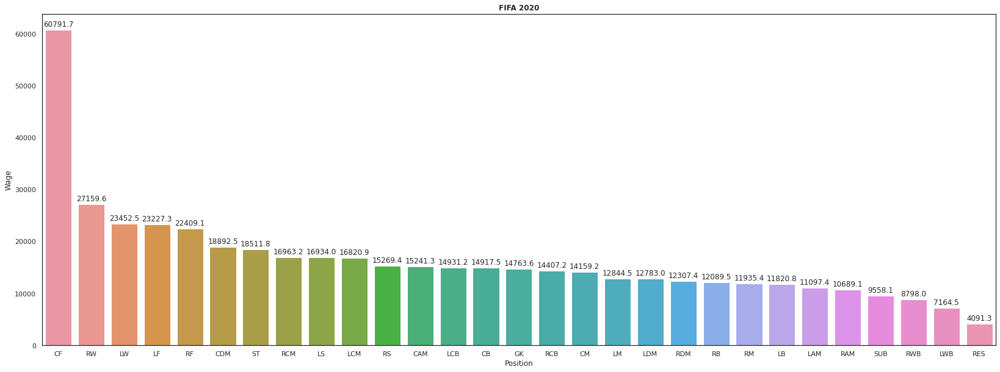

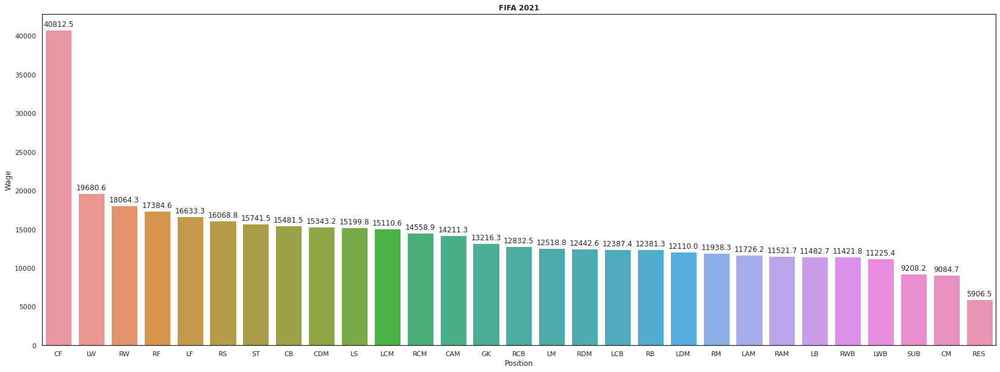

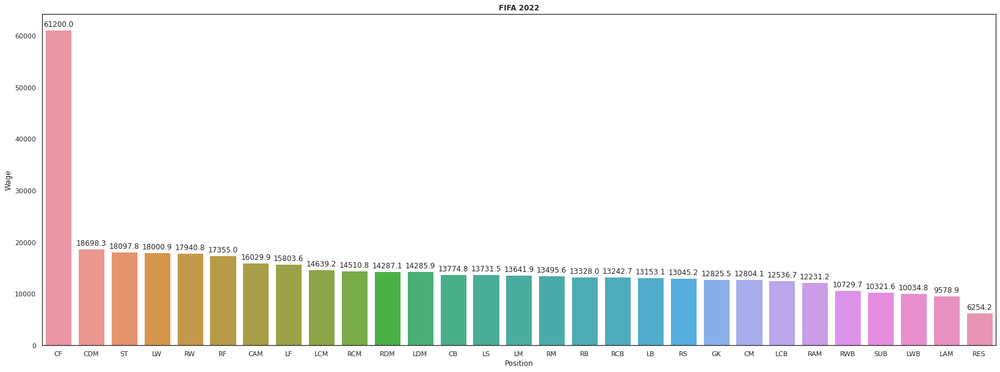

In [ ]:
# Position vs Wage
def position_vs_wage():
  for i, fifa_df in enumerate(fifa_df_list):
    wage_df = fifa_df[['Position', 'Wage']].groupby('Position').mean().sort_values('Wage', ascending=False).reset_index()
    plt.figure(figsize=(28,10))
    splot = sns.barplot(data=wage_df, x='Position', y='Wage')
    plt.title('FIFA ' + str(2017 + i), fontdict={'fontweight': 'bold'})
    for p in splot.patches:
        splot.annotate(format(p.get_height(), '.1f'), 
                      (p.get_x() + p.get_width() / 2., p.get_height()), 
                      ha = 'center', va = 'center', 
                      xytext = (0, 9), 
                      textcoords = 'offset points')
    plt.show()
position_vs_wage()


##2.10 Player Attribues in each League

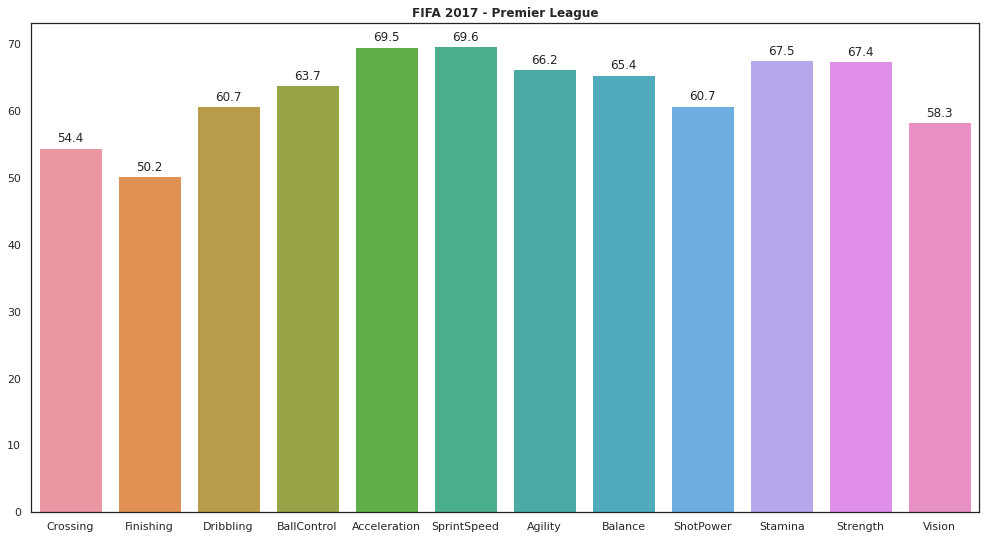

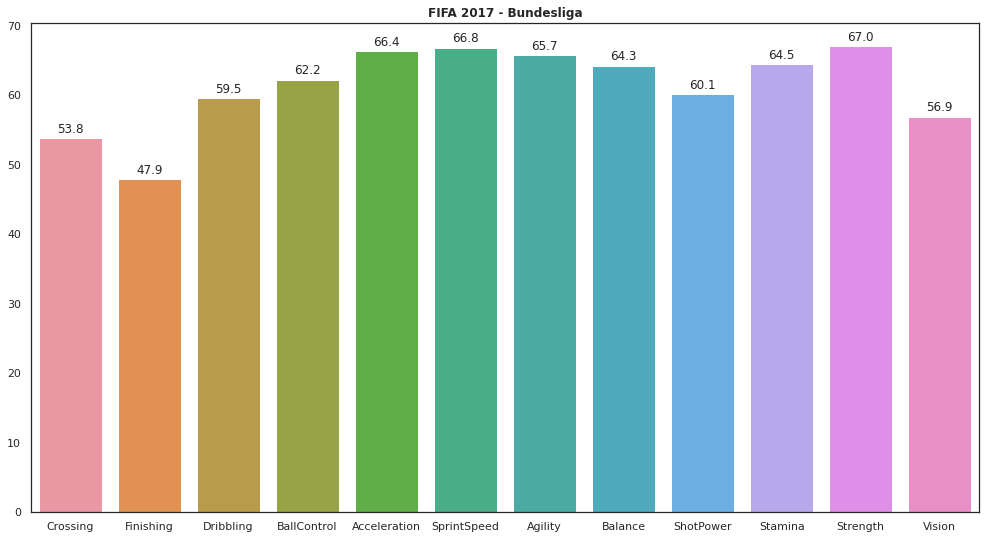

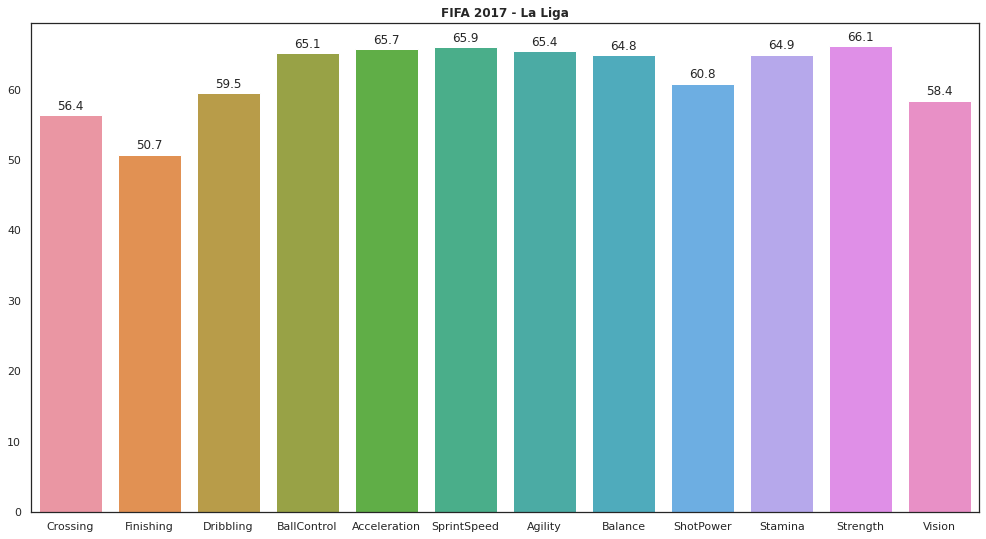

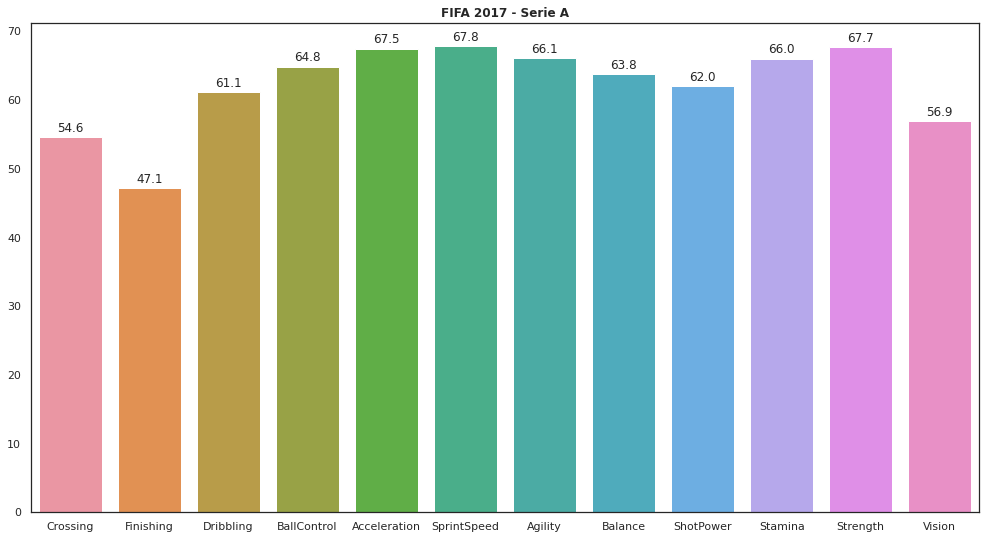

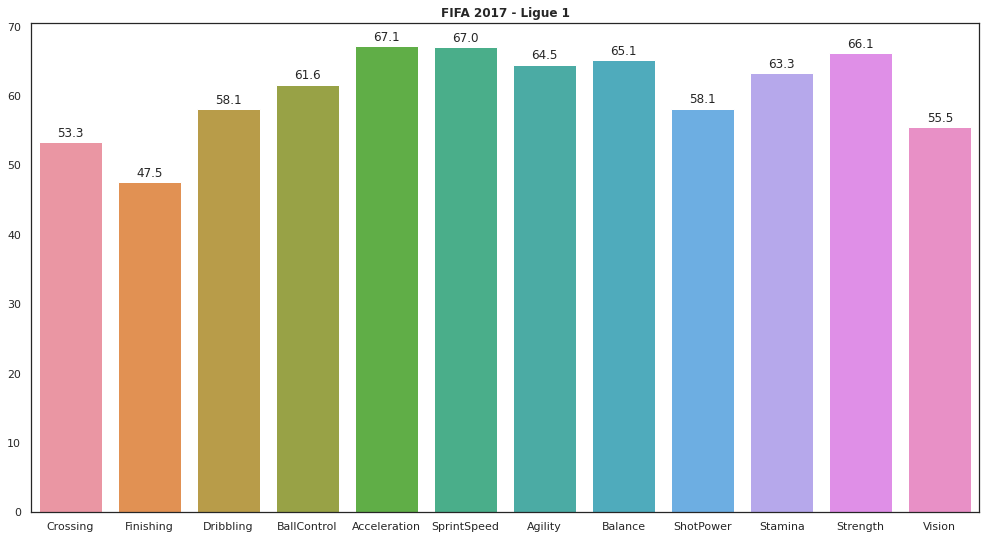

...

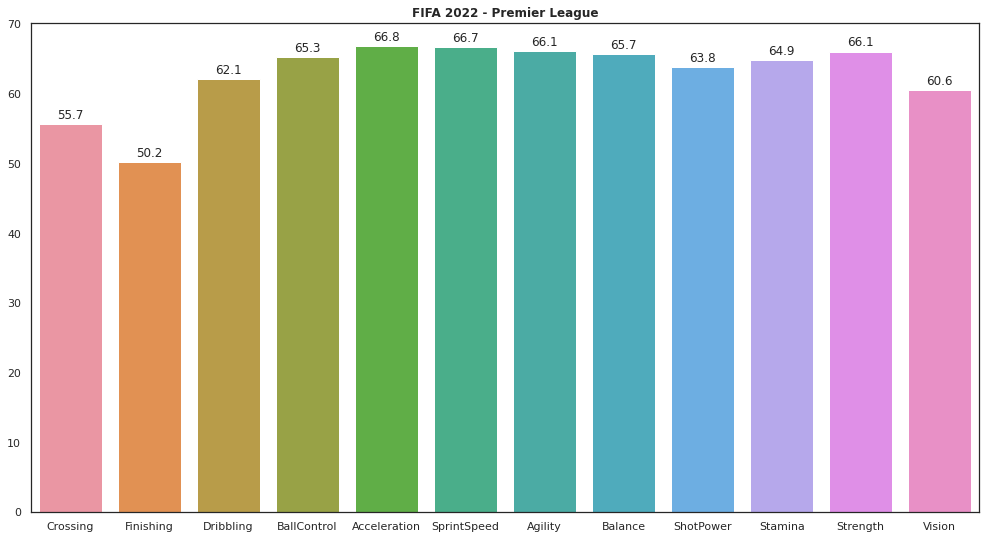

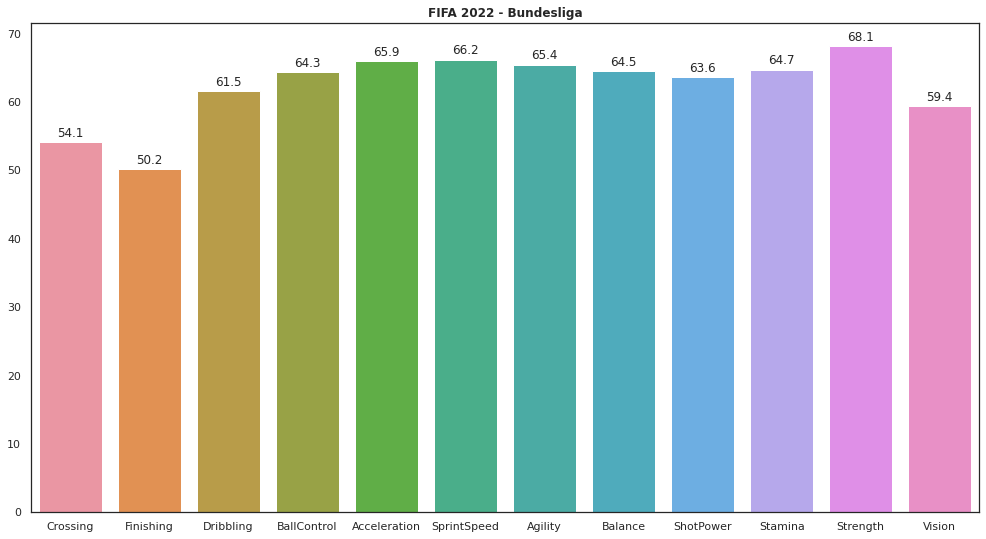

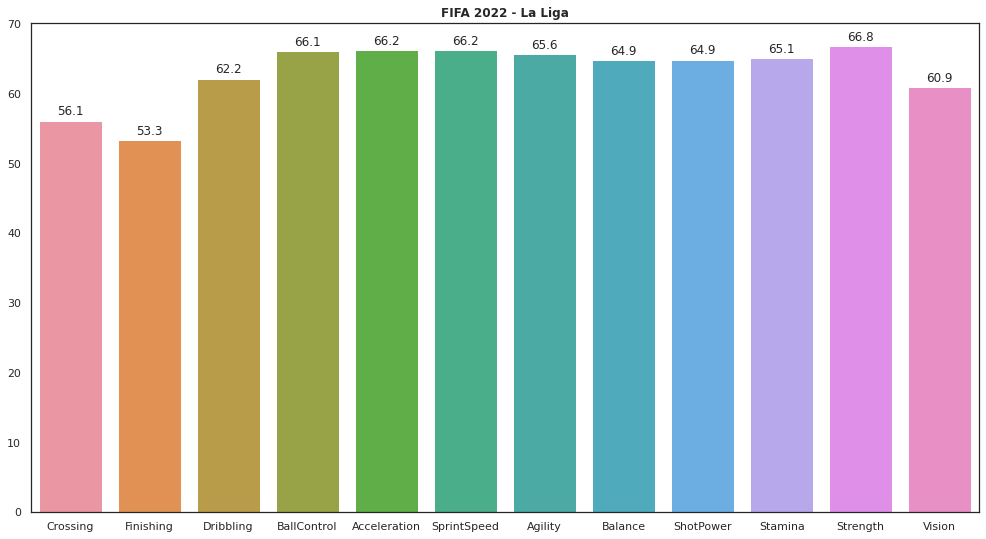

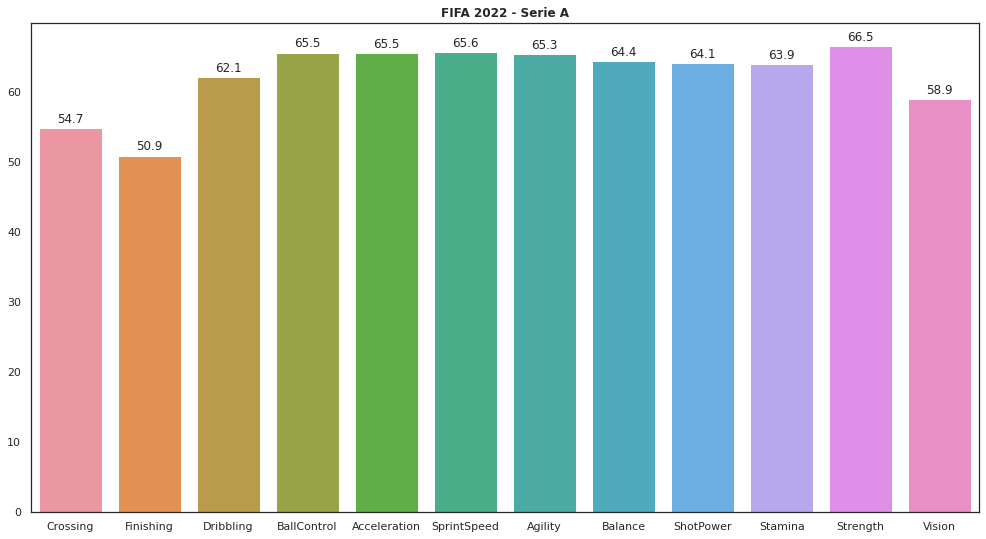

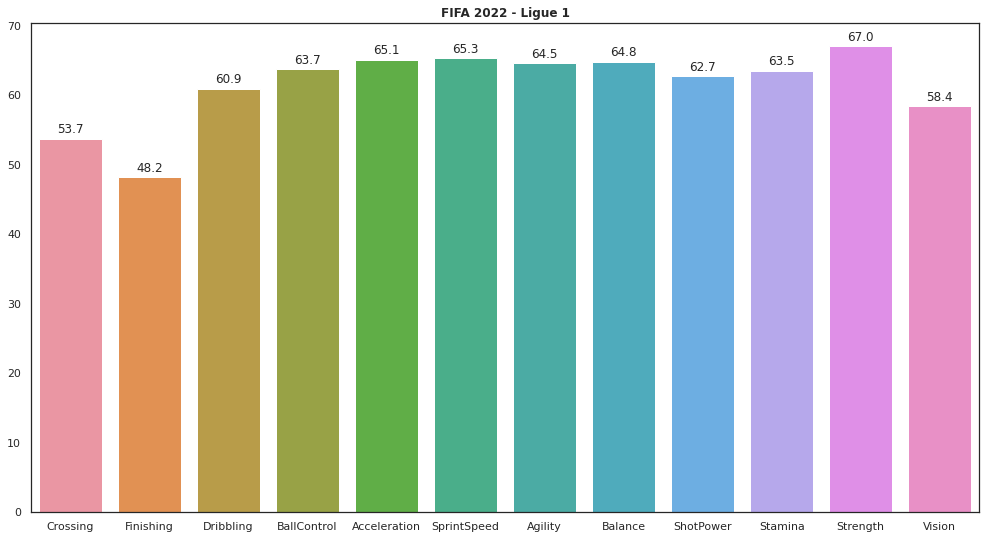

In [ ]:
# Attributes vs League
def attribute_vs_league():
  leagues = ['Premier League', 'Bundesliga', 'La Liga', 'Serie A', 'Ligue 1']
  columns = attributes.copy()
  columns.append('League')
  for i, fifa_df in enumerate(fifa_df_list):
    df = fifa_df[columns]
    df = df[df['League'].isin(leagues)]
    df = df.groupby('League').mean().reset_index()
    for league in leagues:
      plot_df = df[df['League'] == league]
      plt.figure(figsize=(17,9))
      plt.title('FIFA ' + str(2017 + i ) + ' - ' + league, fontdict={'fontweight' : 'bold'})
      splot = sns.barplot(data=plot_df)
      for p in splot.patches:
            splot.annotate(format(p.get_height(), '.1f'), 
                          (p.get_x() + p.get_width() / 2., p.get_height()), 
                          ha = 'center', va = 'center', 
                          xytext = (0, 9), 
                          textcoords = 'offset points')
      plt.show()
attribute_vs_league()




##2.11 Nationality vs Average Overall

In [ ]:
#Min players is the min number a country must have to be considered
def nationality_vs_overall(minPlayers):

  for i, fifa_df in enumerate(fifa_df_list):
    nationality_overalls = {}
    for index, row in fifa_df.iterrows():
      if row['Nationality'] not in nationality_overalls:
          nationality_overalls[row["Nationality"]] = (row["Overall"], 1)
      else:
        (currSum, currNum) = nationality_overalls[row["Nationality"]]
        nationality_overalls[row["Nationality"]] = (currSum + row["Overall"], currNum + 1)
        
    keys = list(nationality_overalls.keys())
    vals = [float(nationality_overalls[k][0]/nationality_overalls[k][1]) if nationality_overalls[k][1] >= minPlayers else 0 for k in keys]
    
    vals, keys = zip(*sorted(zip(vals, keys)))
    keys = np.array(keys[-9:])
    vals = np.array(vals[-9:])

    plt.figure(figsize=(17,9))
    plt.title('FIFA ' + str(2017 + i ) + ' - ' + "Top 10 Nationalities by Average Overall Rating, Minimum " + str(minPlayers) + " Players", fontdict={'fontweight' : 'bold'})
    plt.xlabel('Nationality')
    plt.ylabel("Average Overall Rating (out of 100)")
    splot = sns.barplot(x=keys, y=vals)
    for p in splot.patches:
          splot.annotate(format(p.get_height(), '.1f'), 
                        (p.get_x() + p.get_width() / 2, p.get_height()), 
                        ha = 'center', va = 'center', 
                        xytext = (0, 9), 
                        textcoords = 'offset points')
    plt.show()

###2.11.1 Nationality vs Average Overall for Minimum 50 Players

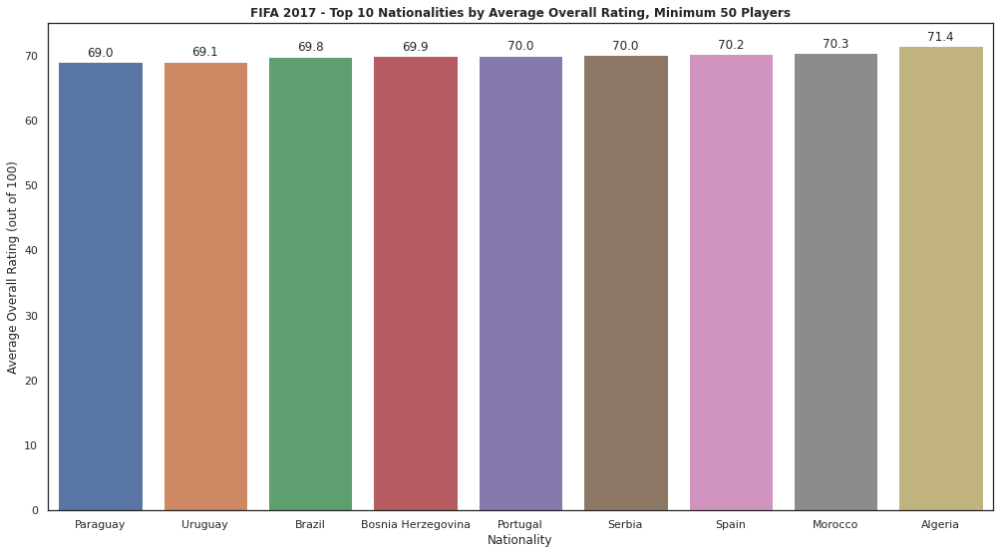

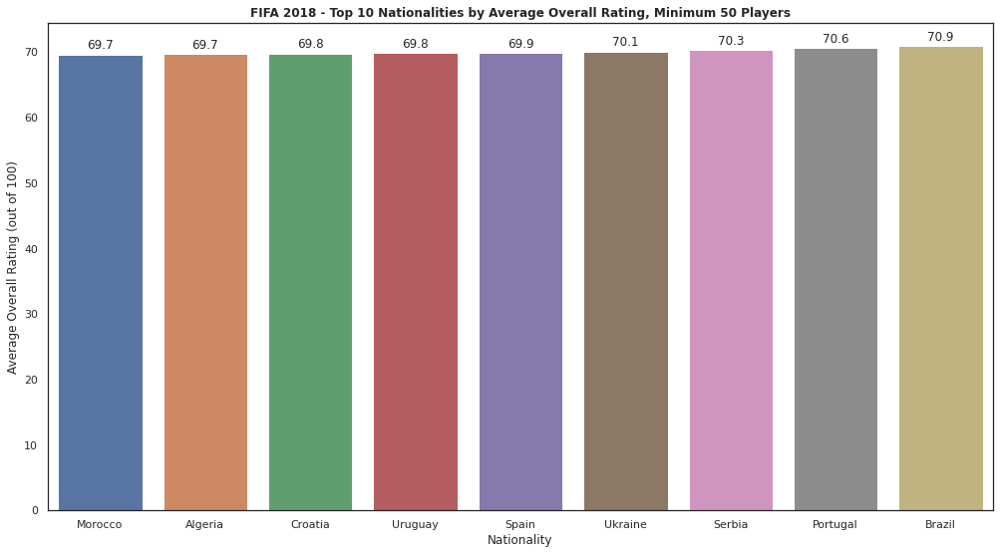

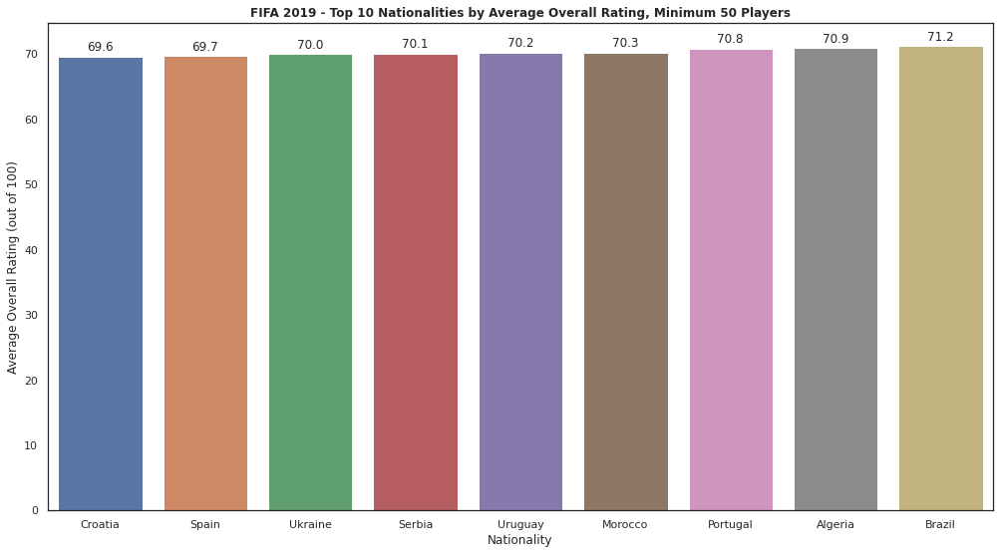

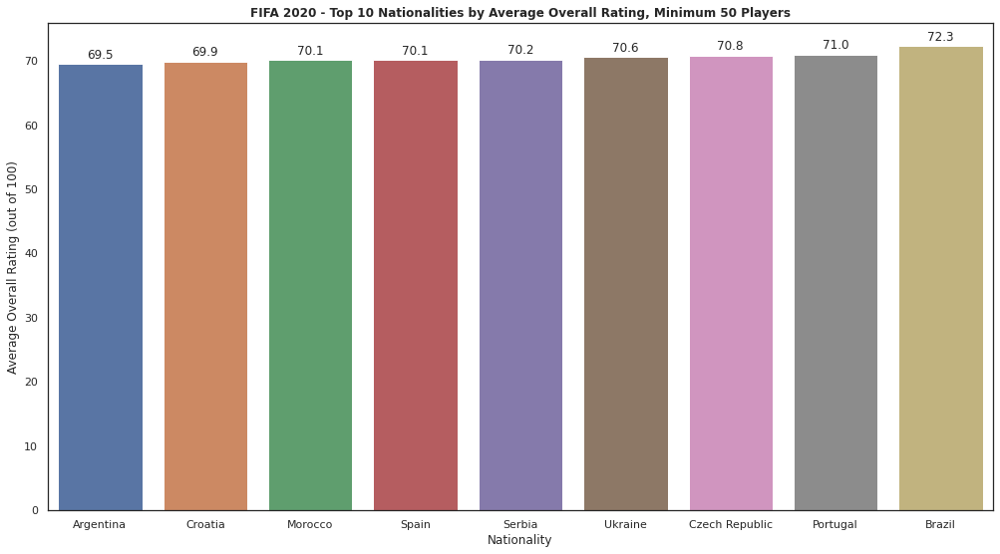

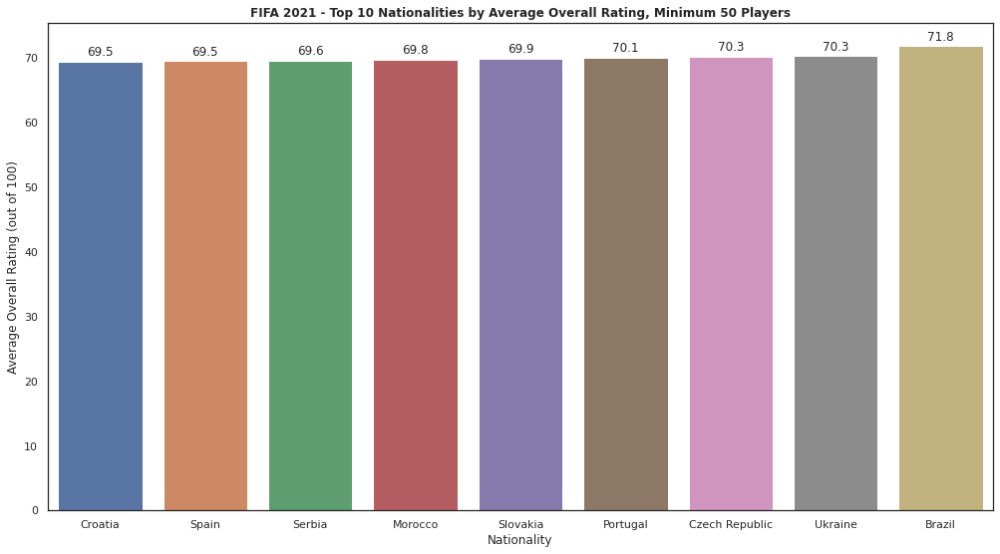

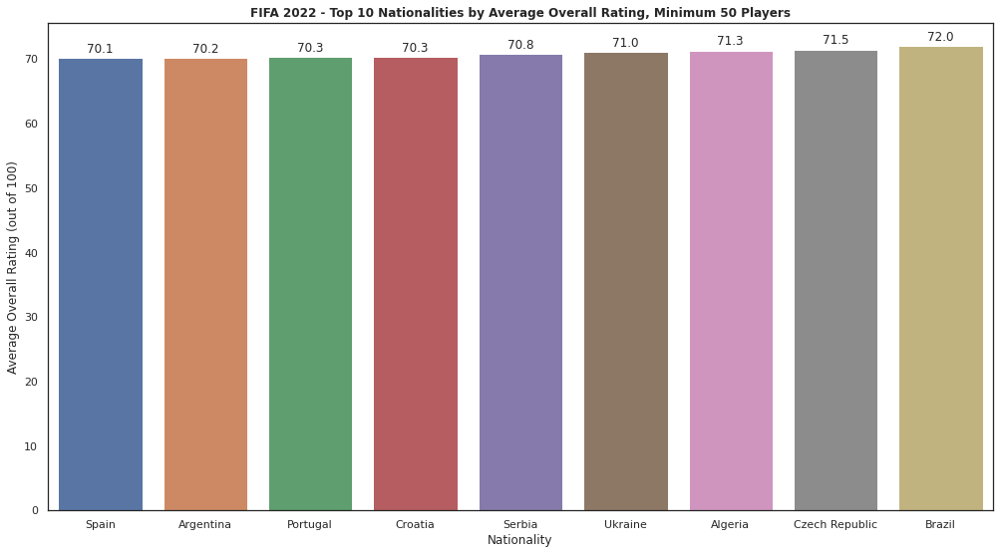

In [ ]:
nationality_vs_overall(50)

###2.11.2 Nationality vs Average Overall for Minimum 1 Players

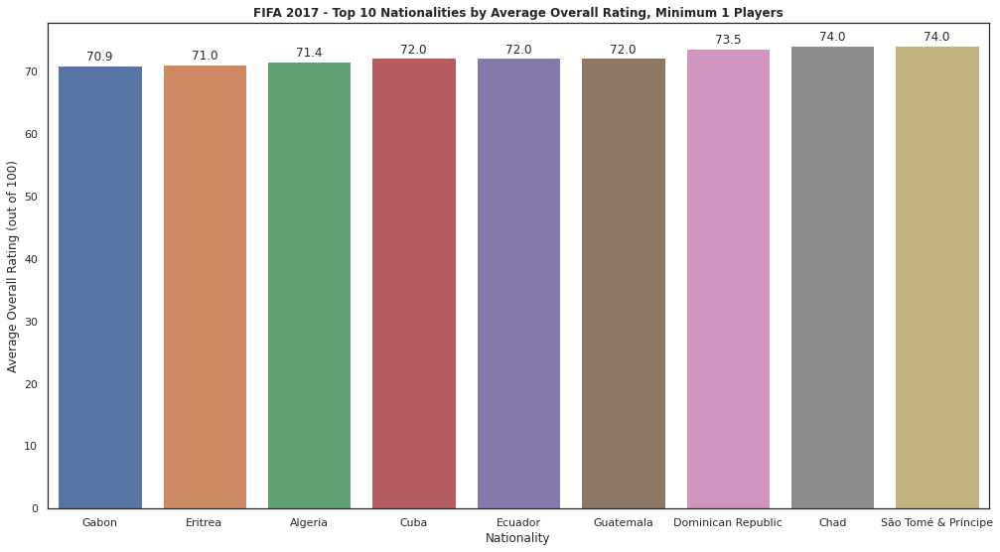

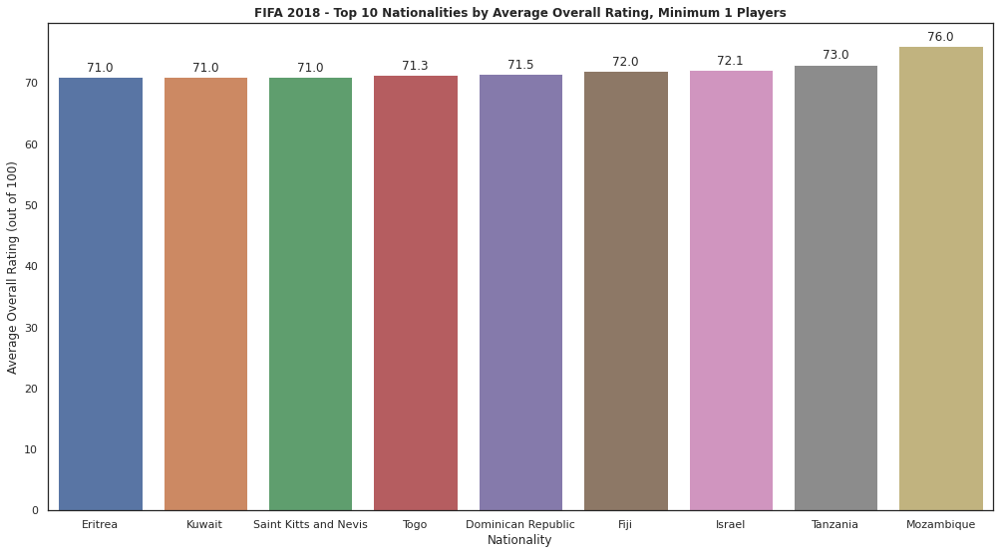

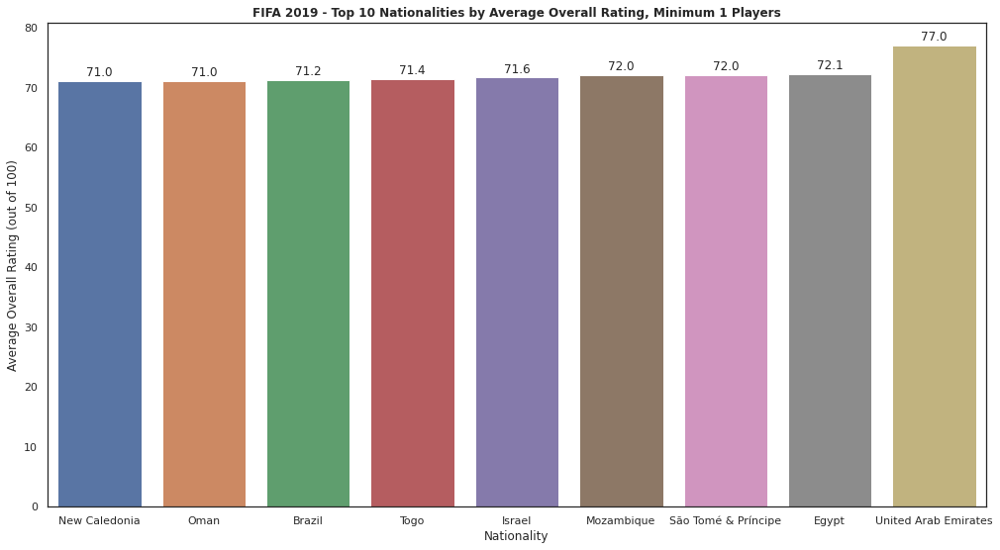

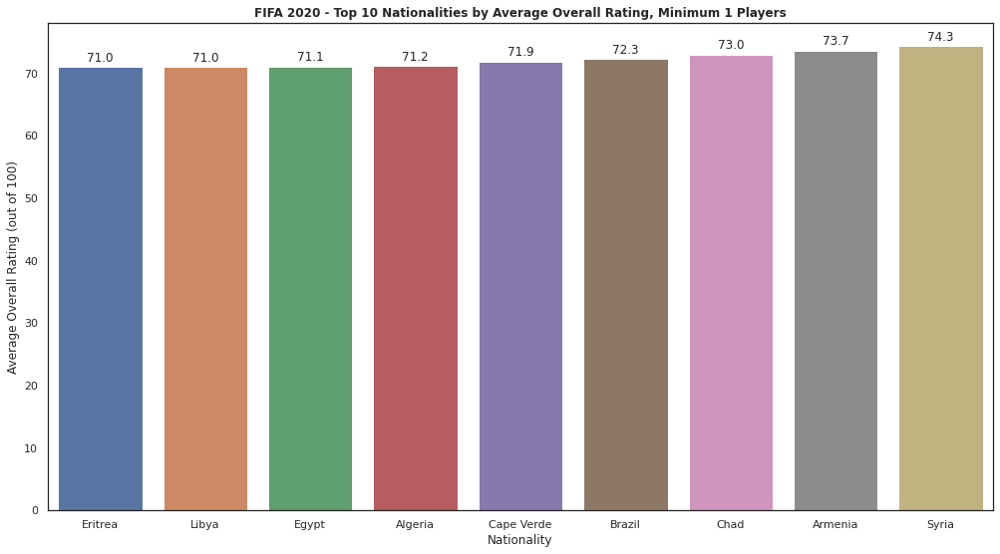

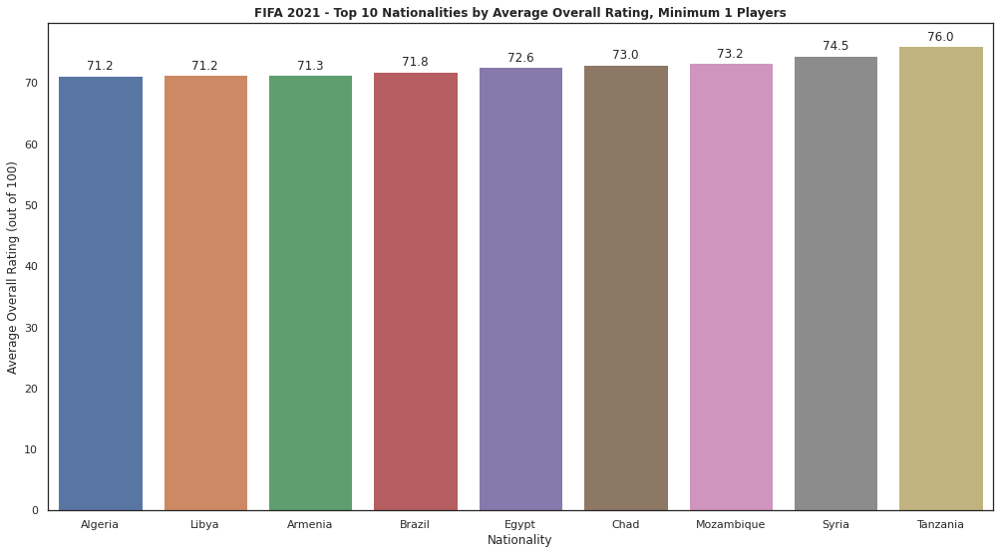

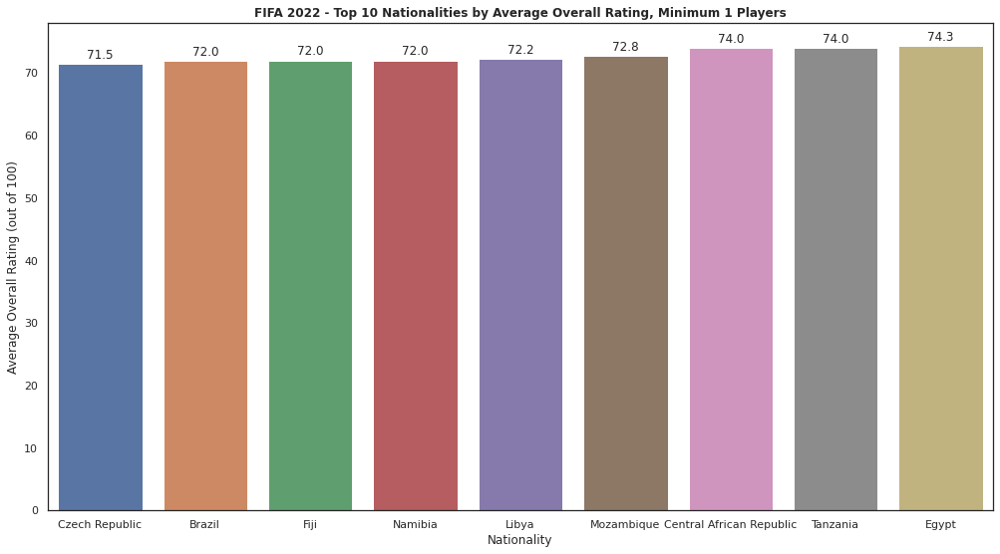

In [ ]:
nationality_vs_overall(1)

##2.12 Nationality vs Average Transfer Value (Model Specific)

In [ ]:
#Min players is the minimum number a country must have to be considered
def nationality_vs_transfer_val(minPlayers):

  for i, fifa_df in enumerate(fifa_df_list):
    nationality_overalls = {}
    for index, row in fifa_df.iterrows():
      if row['Nationality'] not in nationality_overalls:
          nationality_overalls[row["Nationality"]] = (row["Value"], 1)
      else:
        (currSum, currNum) = nationality_overalls[row["Nationality"]]
        nationality_overalls[row["Nationality"]] = (currSum + row["Value"], currNum + 1)
        
    keys = list(nationality_overalls.keys())
    vals = [float(nationality_overalls[k][0]/nationality_overalls[k][1]) if nationality_overalls[k][1] >= minPlayers else 0 for k in keys]
    
    vals, keys = zip(*sorted(zip(vals, keys)))
    keys = np.array(keys[-9:])
    vals = np.array(vals[-9:])
    plt.figure(figsize=(17,9))
    plt.title('FIFA ' + str(2017 + i ) + ' - ' + "Top 10 Nationalities by Average Transfer Value, Minimum " + str(minPlayers) + " Players", fontdict={'fontweight' : 'bold'})
    plt.xlabel('Nationality')
    plt.ylabel("Average Transfer Value (€)")
    splot = sns.barplot(x=keys, y=vals)
    for p in splot.patches:
          splot.annotate(format(p.get_height(), '.1f'), 
                        (p.get_x() + p.get_width() / 2, p.get_height()), 
                        ha = 'center', va = 'center', 
                        xytext = (0, 9), 
                        textcoords = 'offset points')
    plt.show()

###2.12.1 Nationality vs Average Transfer Value for Minimum 50 Players

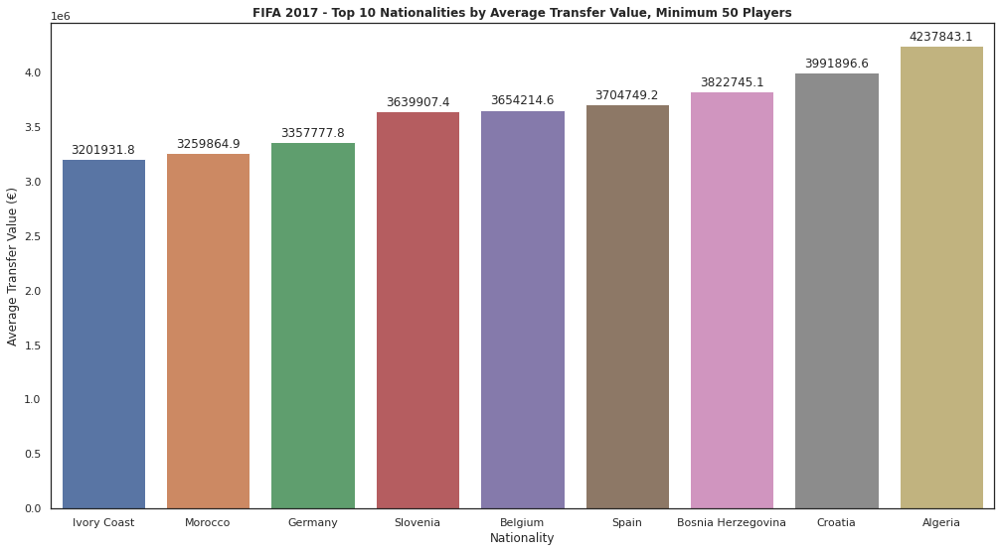

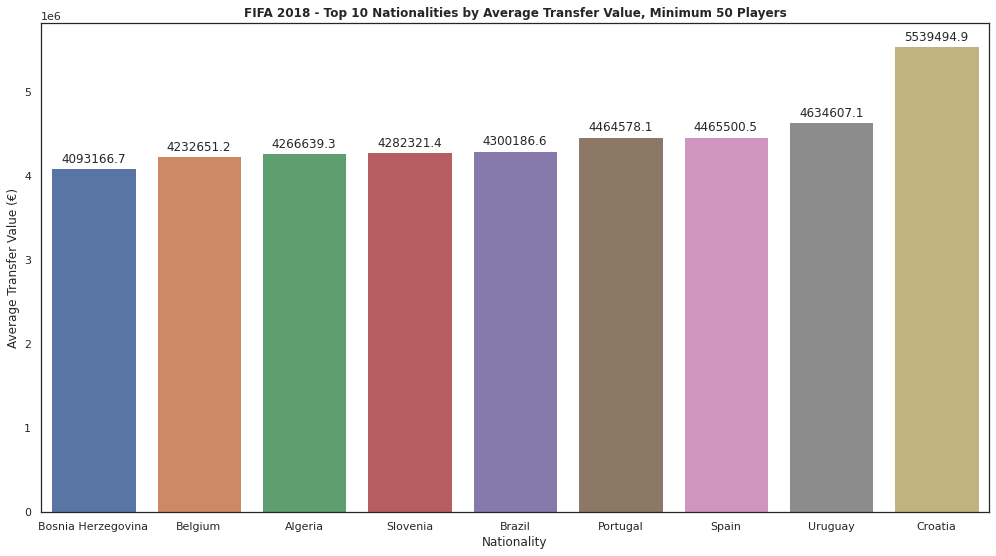

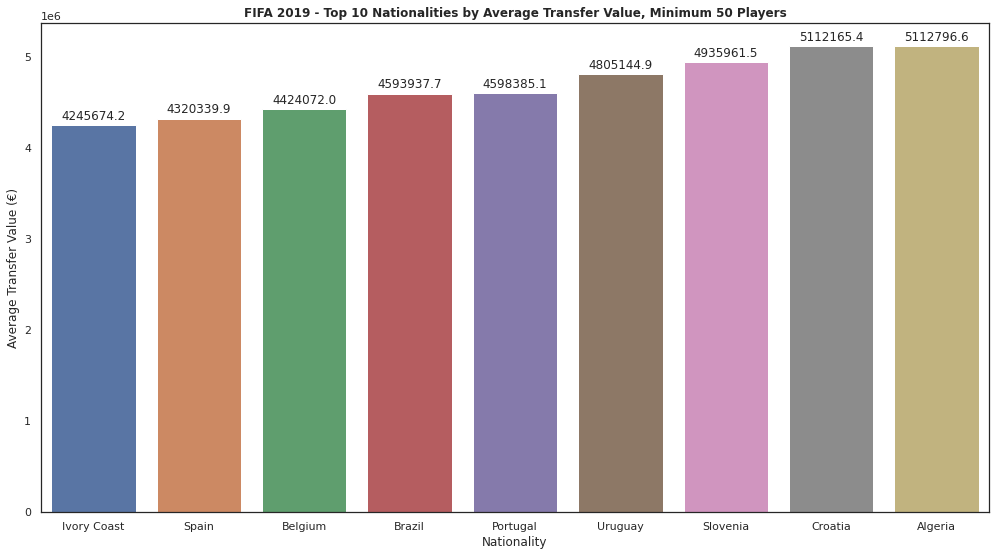

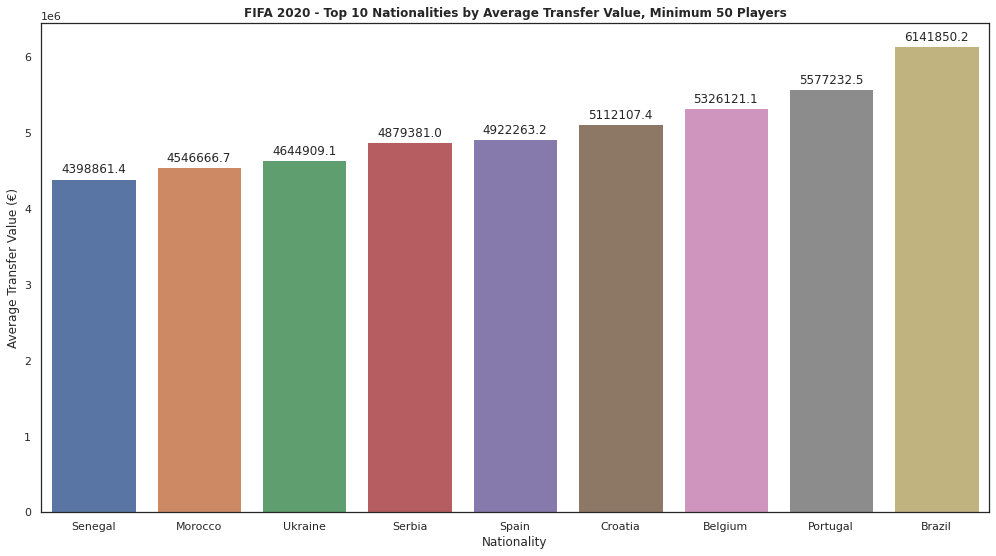

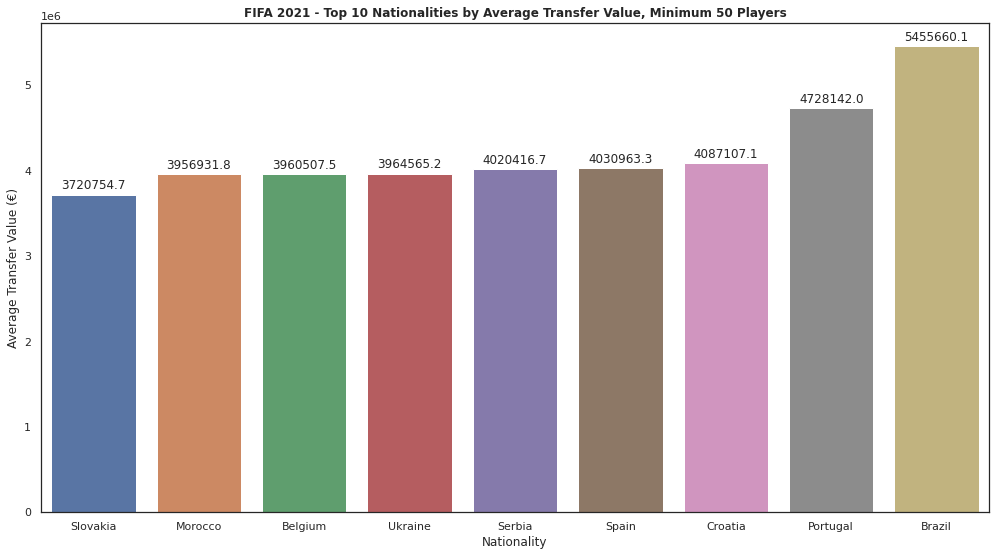

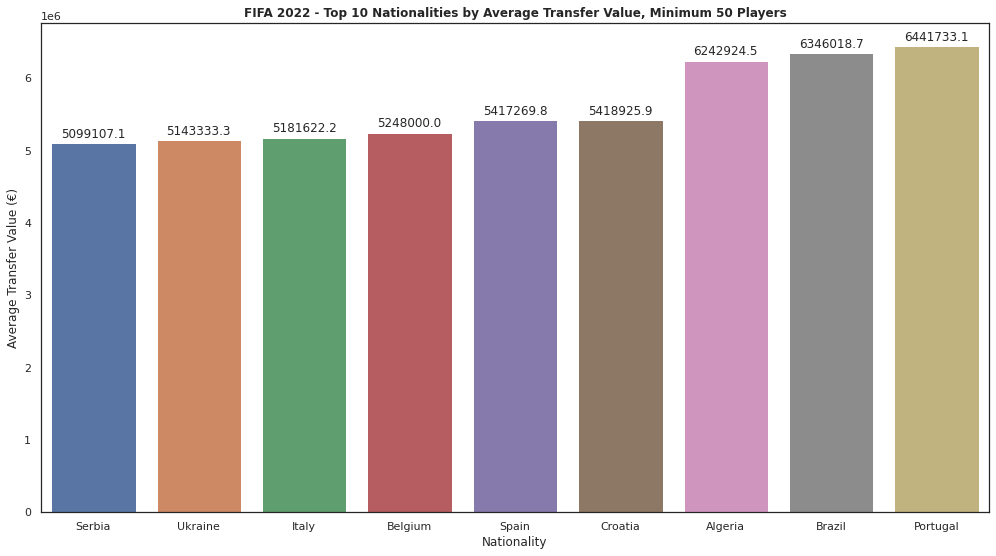

In [ ]:
nationality_vs_transfer_val(50)

###2.12.1 Nationality vs Average Transfer Value for Minimum 1 Players

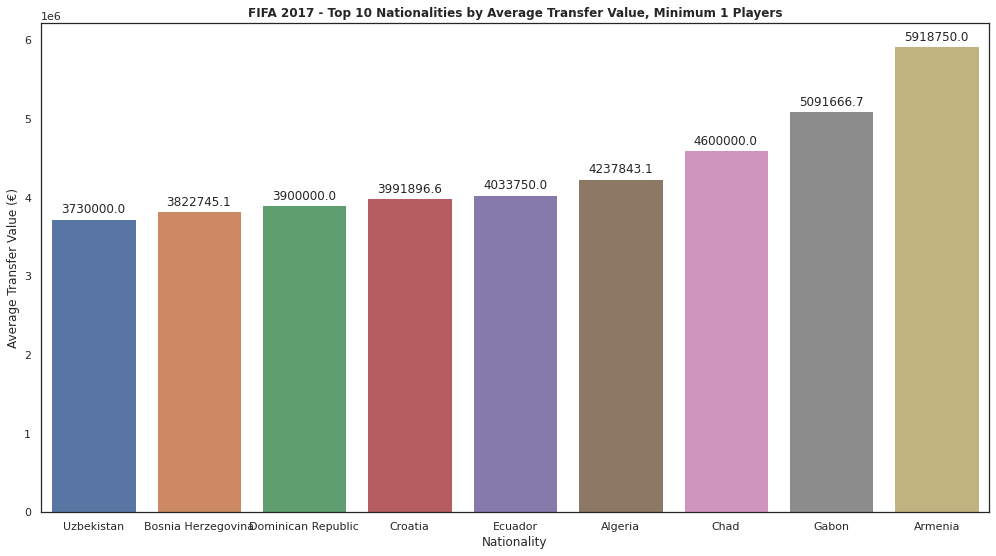

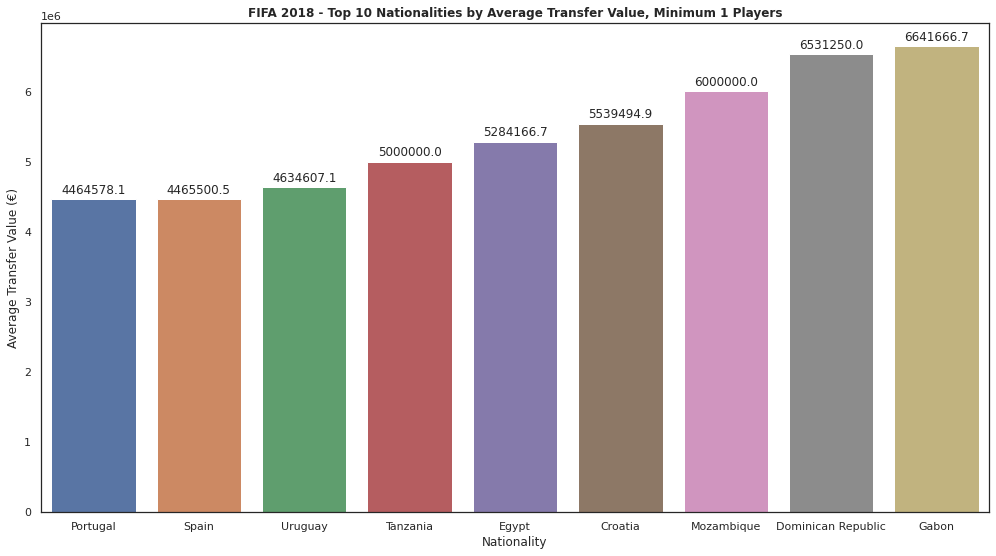

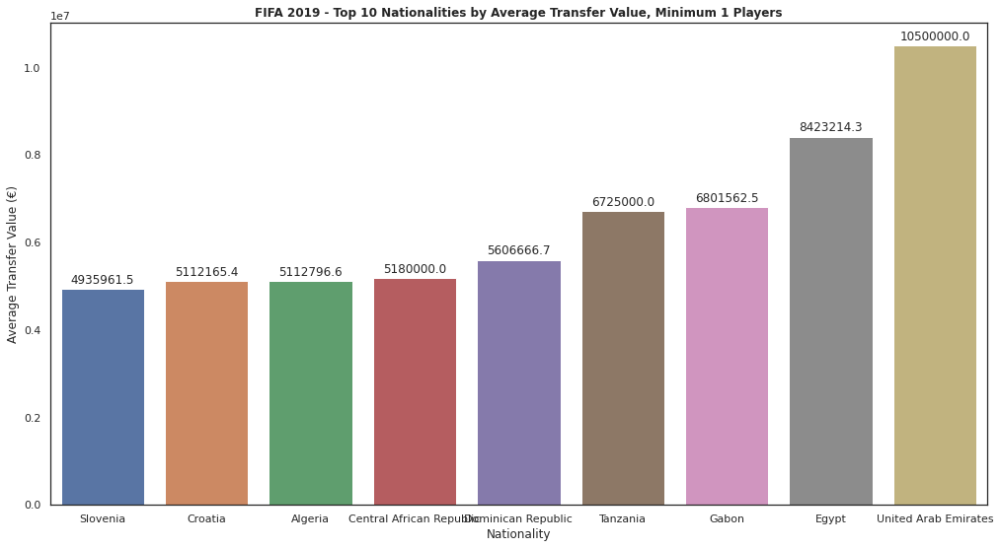

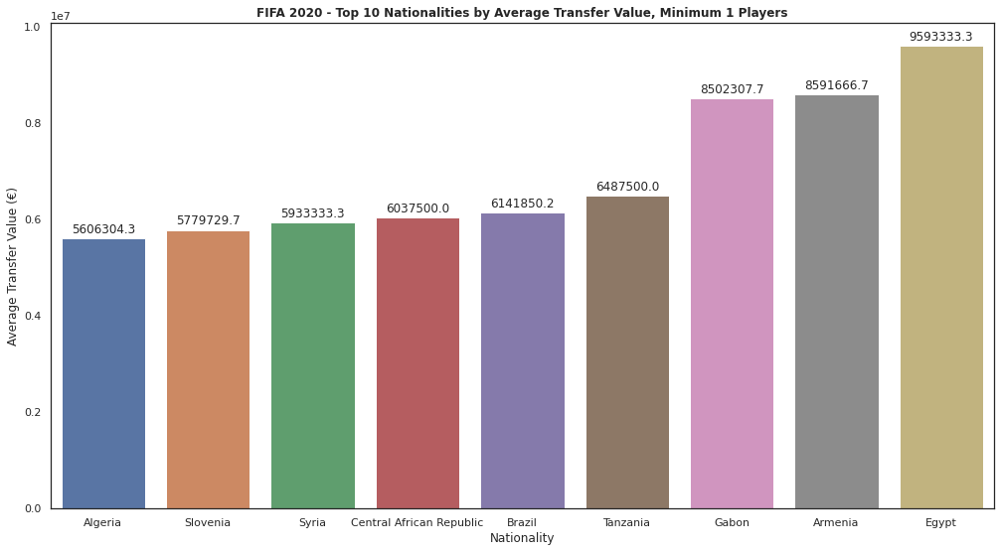

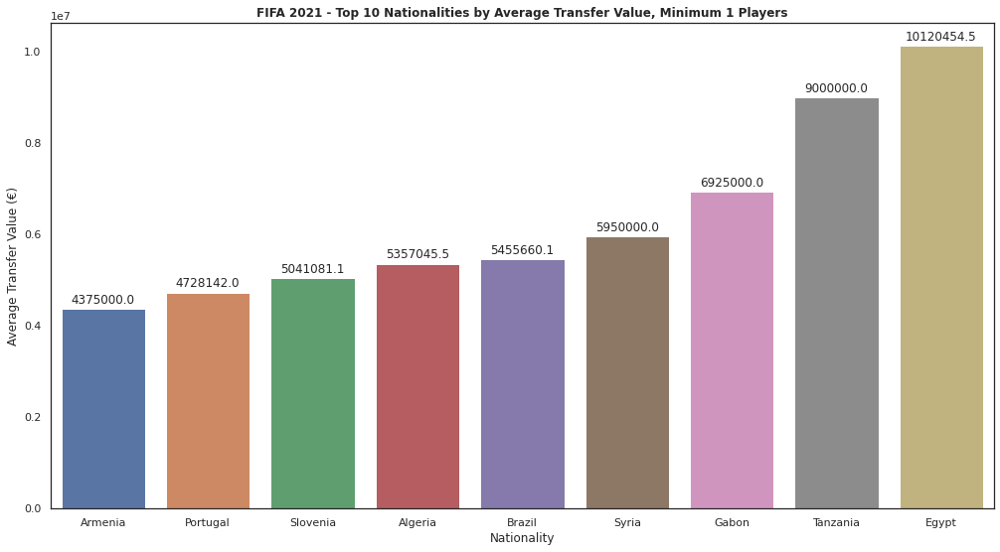

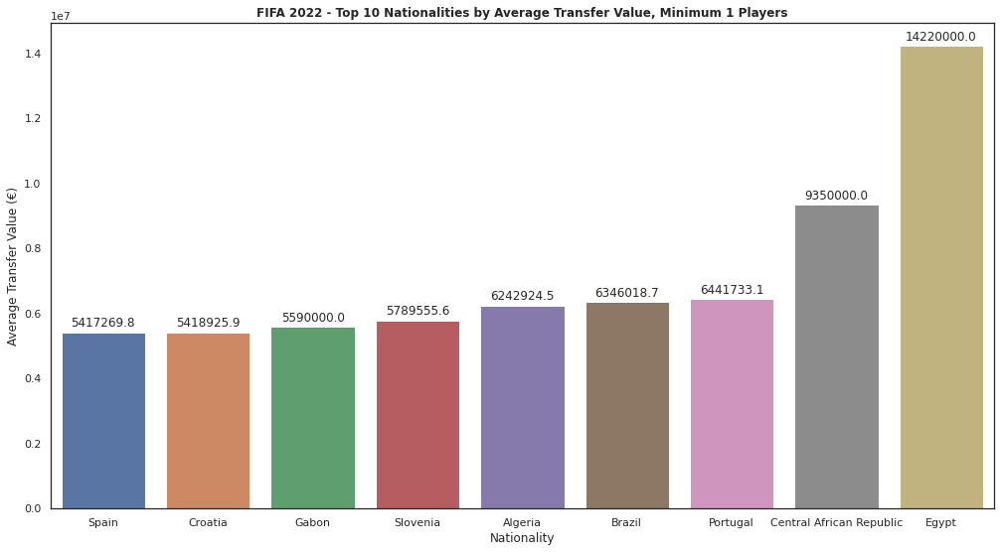

In [ ]:
nationality_vs_transfer_val(1)

##2.13 Overall Rating vs Transfer Value (Model Specific)

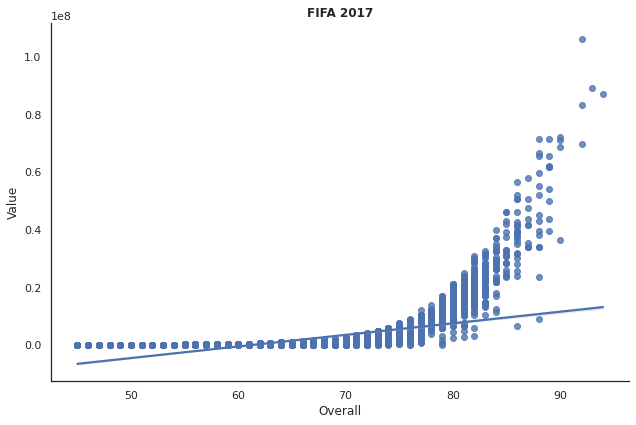

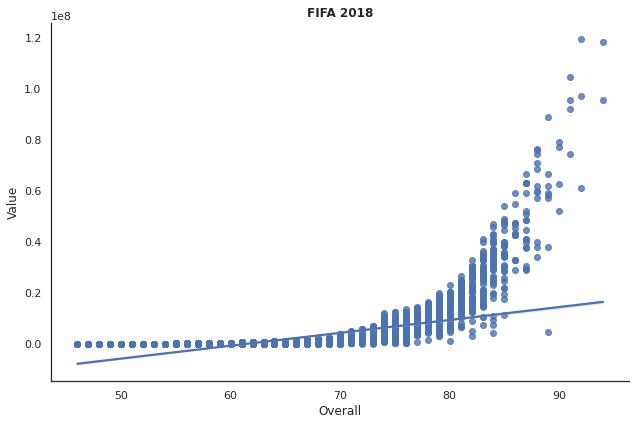

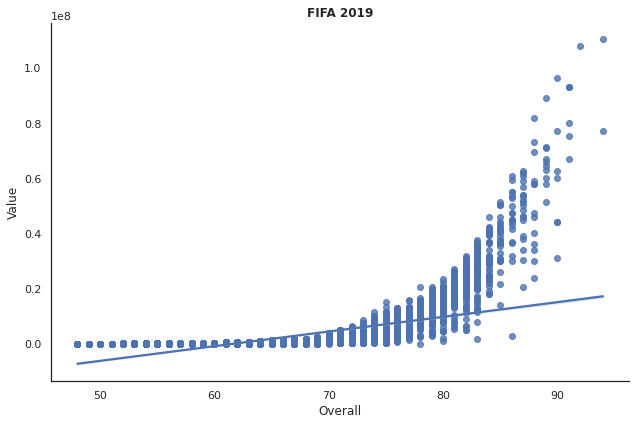

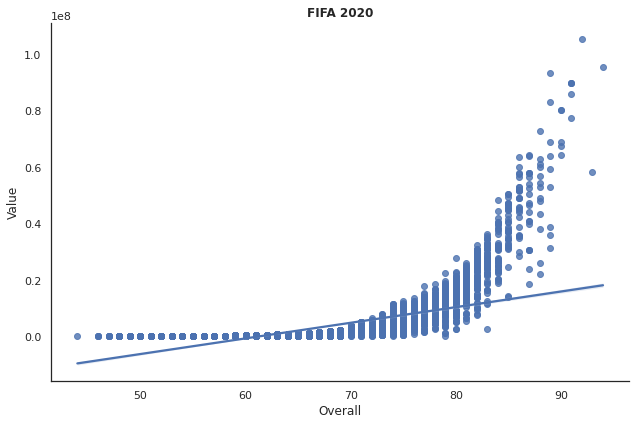

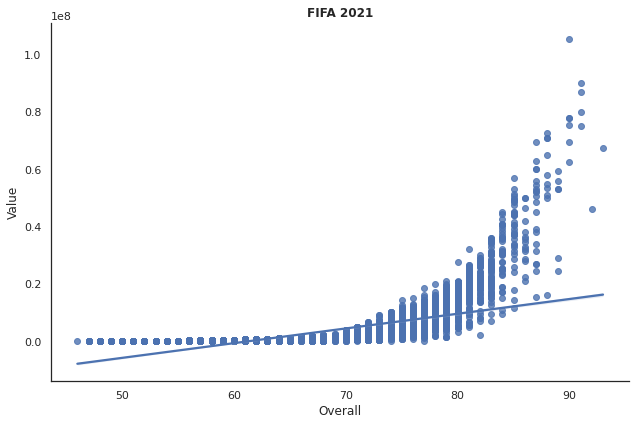

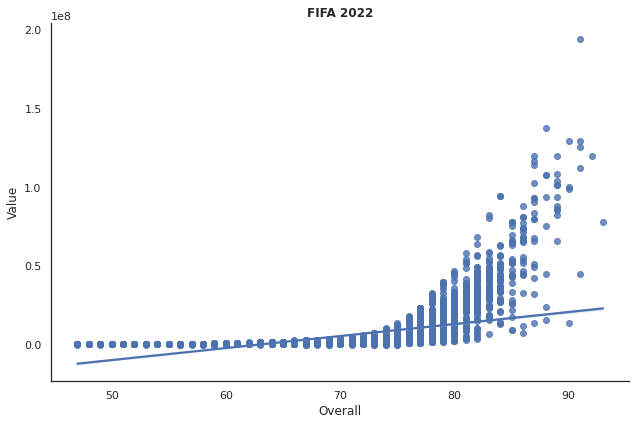

In [ ]:
def overall_vs_value():
  for i, fifa_df in enumerate(fifa_df_list):
    sns.lmplot(data=fifa_df, x = "Overall", y = "Value", height=6, aspect=1.5)
    plt.title(label='FIFA ' + str(2017 + i), fontdict = {'fontweight': 'bold'})
    plt.show()
overall_vs_value()

##2.14 Wage (Weekly) vs Transfer Value (Model Specific)

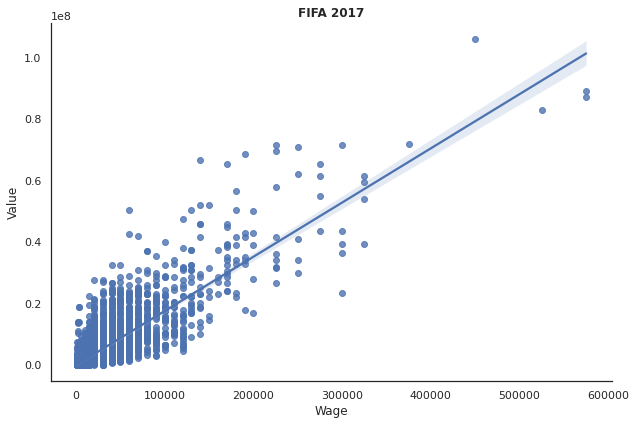

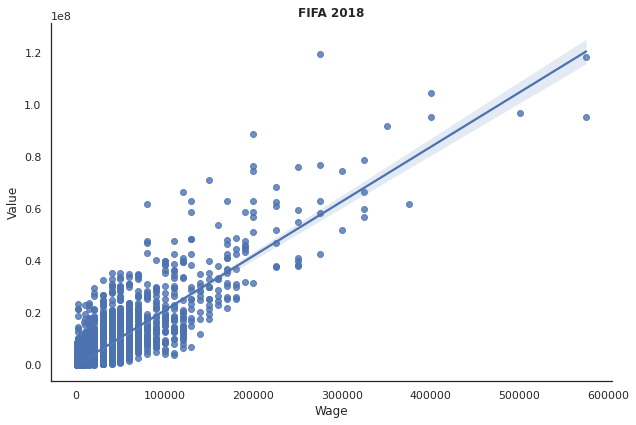

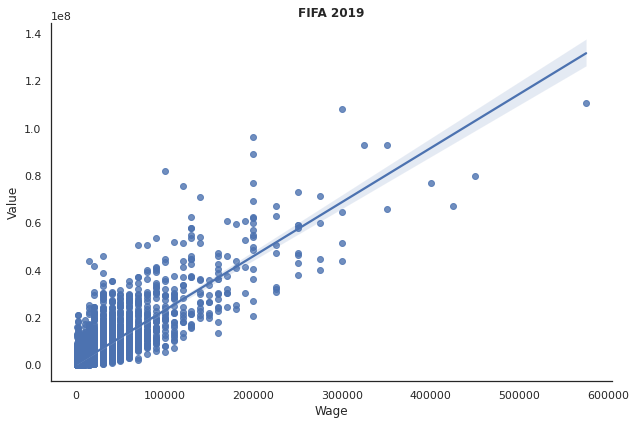

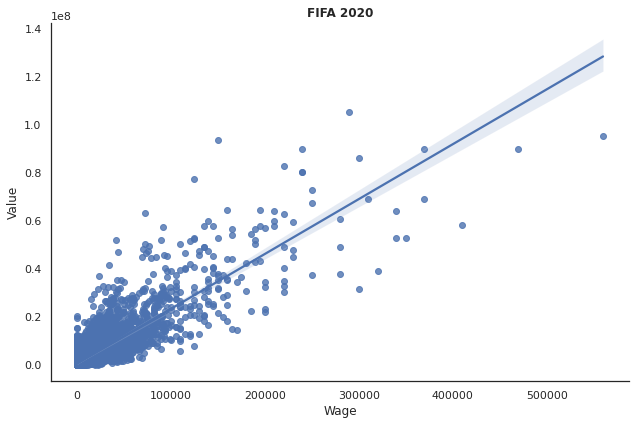

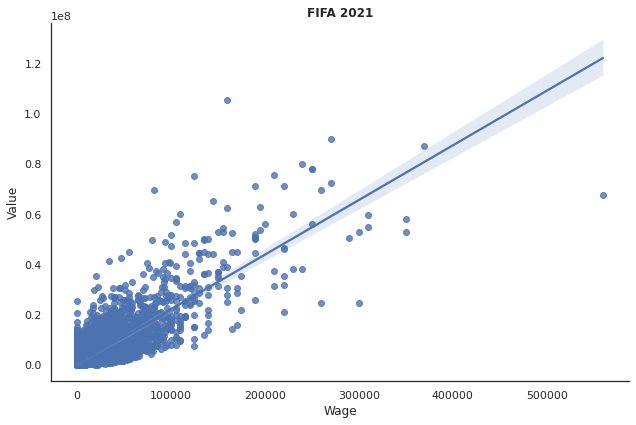

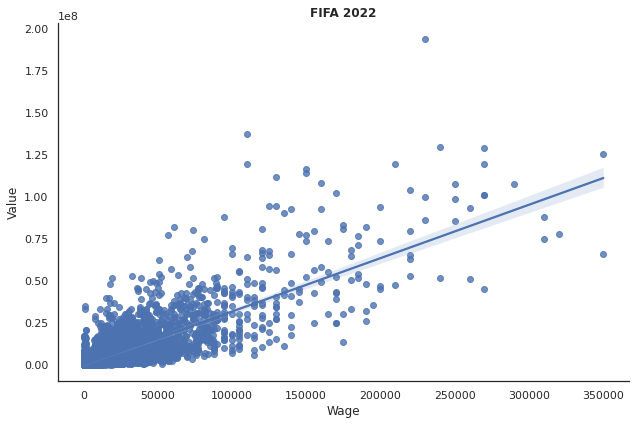

In [ ]:
def wage_vs_value():
  for i, fifa_df in enumerate(fifa_df_list):
    sns.lmplot(data=fifa_df, x = "Wage", y = "Value", height=6, aspect=1.5)
    plt.title(label='FIFA ' + str(2017 + i), fontdict = {'fontweight': 'bold'})
    plt.show()
wage_vs_value()

##2.15 Normalized Transfer Value vs League

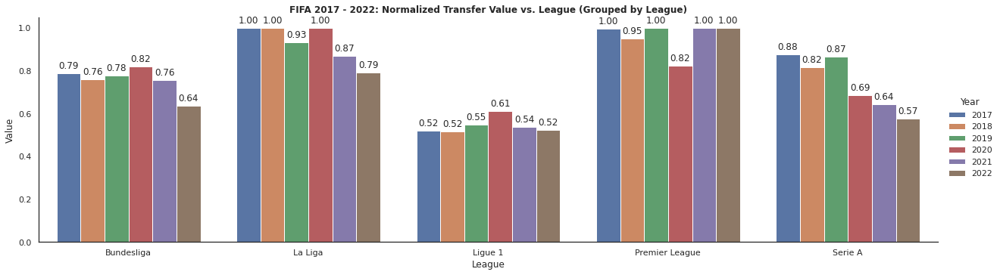

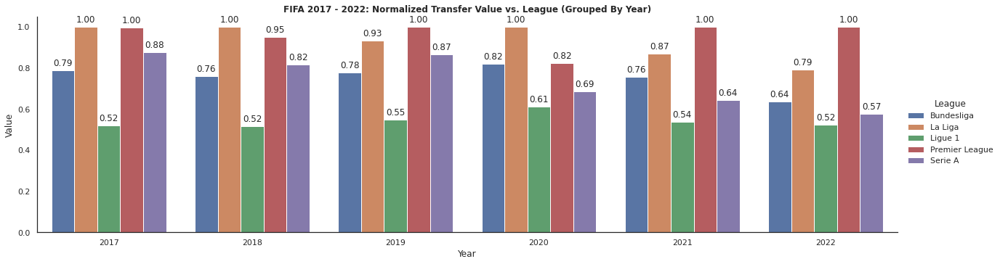

In [ ]:
europe_big_five = ['Premier League', 'Bundesliga', 'La Liga', 'Serie A', 'Ligue 1']
def norm_transfer_val_vs_league(fields, sg):
  all_years = fifa_df_list[0]
  for i, fifa_df in enumerate(fifa_df_list):
    grouped = pd.DataFrame(fifa_df.groupby('League').mean().reset_index())
    columns_to_keep = set(['League', 'Value'])
    grouped = grouped[columns_to_keep]
    grouped.sort_values(by='Value', ascending=False)
    grouped['Year'] = 2017 + i
    
    # Min-Max Scaling (done before filtering out leagues)
    grouped['Value'] = (grouped['Value'] - grouped['Value'].min()) / (grouped['Value'].max() - grouped['Value'].min())    
    
    if isinstance(fields, list):
      grouped = grouped.loc[grouped['League'].isin(fields)]
    elif isinstance(fields, int):
      grouped = grouped.head(fields)
    
    if sg and i == 0:
      all_years = grouped
    elif sg:
      all_years = all_years.append(grouped)
  if sg:
    all_years = all_years.reset_index()
    splot = sns.catplot(x='League', y='Value', hue='Year', data=all_years, kind='bar', height=5, aspect=3.5)
    plt.title('FIFA 2017 - 2022: Normalized Transfer Value vs. League (Grouped by League)', fontdict={'fontweight': 'bold'})
    for ax in splot.axes.ravel():
      for p in ax.patches:
        ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')


    splot = sns.catplot(x='Year', y='Value', hue='League', data=all_years, kind='bar', height=5, aspect=3.5)
    plt.title('FIFA 2017 - 2022: Normalized Transfer Value vs. League (Grouped By Year)', fontdict={'fontweight': 'bold'})
    for ax in splot.axes.ravel():
      for p in ax.patches:
        ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

norm_transfer_val_vs_league(europe_big_five, True)

#Section 3: Modeling

Linear/Logistic Regression, and Random Forest (Can split into low, mid, high)

(maybe 2 for transfer value, and 2 for something else)

1. Concatenating all the dataframes into one. 
2. Creating a list of columns to drop: `drop_columns`
3. Creating a list of columns to create labels for: `cat_columns`



##3.1 Preparing Data for Modeling

In [ ]:
# Bucket size
num_buckets = 10

In [ ]:
from sklearn.preprocessing import LabelEncoder

def get_features_labels(fifa_dfs):
  df = pd.concat(fifa_df_list).copy() if isinstance(fifa_dfs, list) else fifa_dfs.copy()
  drop_columns = ['ID', 'Name', 'Preferred Foot', 'Jersey Number', 'Contract Valid Until', 'Work Rate', 'Best Position','International Reputation']
  cat_columns = ['Nationality', 'League', 'Position', 'Body Type', 'Club']
  df = df.drop(labels = drop_columns, axis = 1)
  if 'DefensiveAwareness' in df.columns:
    df = df.drop(labels=['DefensiveAwareness'], axis=1)

  # Converting the categorical features and converting them into one hot vectors
  le = LabelEncoder()
  nationality_labels = le.fit_transform(df['Nationality'])
  league_labels = le.fit_transform(df['League'])
  body_labels = le.fit_transform(df['Body Type'])
  club_labels = le.fit_transform(df['Club'])
  position_labels = le.fit_transform(df['Position'])

  df['nationality_labels'] = nationality_labels
  df['league_labels'] = league_labels
  df['body_labels'] = body_labels
  df['position_labels'] = position_labels
  df['club_labels'] = club_labels

  df = df.drop(labels = cat_columns, axis = 1)
  updated_df_corr = df.corr()
  # sns.heatmap(updated_df_corr)

  # Assigning the value label: Value range from 0 - num_buckets - 1
  df['Value Label'] = pd.qcut(df['Value'], q=num_buckets, labels=False, precision=1)
  # For prediction reference
  bins = pd.DataFrame()
  bins['Value Bin'] = pd.qcut(df['Value'], q=num_buckets, precision = 1)
  bins['Value Label'] = df['Value Label'].copy()

  # Establishing the features and labels
  fts = list(df.columns)
  fts.remove('Value Label')
  fts.remove('Value')
  lbls = ['Value Label']
  features = df[fts]
  labels = df[lbls]
  
  return features, labels

features_labels_list = [get_features_labels(fifa_df) for fifa_df in fifa_df_list]

Split Data into Train and Test

In [ ]:
from sklearn.model_selection import train_test_split
features, labels = get_features_labels(fifa_df_list)
x_train, x_test, y_train, y_test = train_test_split(features, 
                                                    labels, 
                                                    test_size = 0.20, 
                                                    train_size = 0.80, 
                                                    random_state = 42)

##3.2 Naive Bayes

Naive Bayes Classifier

In [ ]:
from sklearn.naive_bayes import GaussianNB

clf = GaussianNB()
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
naive_bayes_acc= clf.score(x_test, y_test)
print(naive_bayes_acc)

0.4635816132187162


##3.3 PCA

(97133, 42)


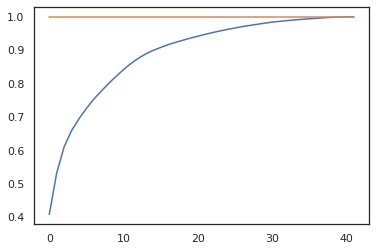

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Dimensionality Reduction with PCA
s = StandardScaler()
scaled_x_train = s.fit_transform(x_train)
scaled_x_test = s.transform(x_test)
print(scaled_x_train.shape)
# find num components to use
pca = PCA(n_components = scaled_x_train.shape[1])
pca_x_train = pca.fit_transform(scaled_x_train)
# plot for explained variance
plt.plot(np.arange(0, 42), np.cumsum(pca.explained_variance_ratio_))
plt.plot(np.arange(0, 42), [0.9995]*42)
plt.show()

In [ ]:
#Find where PCA is at least 99%
components = 0
for i, x in enumerate(np.cumsum(pca.explained_variance_ratio_)):
  if x >= 0.99:
    components = i
    break

print("Num components: {}".format(components))

Num components: 33


In [ ]:
#Perform PCA with 33 components
print(scaled_x_train.shape)
pca = PCA(n_components=components)
pca.fit(scaled_x_train)
x_train_reduced = pca.transform(scaled_x_train)
x_test_reduced = pca.transform(scaled_x_test)
print(scaled_x_train.shape)

(97133, 42)
(97133, 42)


##3.4 Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression

# Generate list of regression models, each subsequent model adds on a new year
clfs = []
for i in range(len(fifa_df_list)):
  if i == 0:
    continue
  training_dfs = fifa_df_list[:i]
  x_train, y_train = get_features_labels(training_dfs)
  clfs.append(LinearRegression().fit(x_train, y_train))

for i, (x_test,y_test) in enumerate(features_labels_list):
  if i == 0:
    continue
  print("Test Data Accuracy without PCA for FIFA {}: ".format(17+i), clfs[i-1].score(x_test, y_test))

print("\n ------------------------------------------------- \n")
regWithPca = LinearRegression().fit(x_train_reduced, y_train)
print("Train Data Accuracy with PCA: ", regWithPca.score(x_train_reduced, y_train))
print("Test Data Accuracy with PCA: ", regWithPca.score(x_test_reduced, y_test))

Train Data Accuracy without PCA for FIFA 18:  0.9065569580480287
Train Data Accuracy without PCA for FIFA 19:  0.9118843390386203
Train Data Accuracy without PCA for FIFA 20:  0.923835636293558
Train Data Accuracy without PCA for FIFA 21:  0.9082690376474717
Train Data Accuracy without PCA for FIFA 22:  0.8439685316620665

 ------------------------------------------------- 

Train Data Accuracy with PCA:  0.8766950420015381
Test Data Accuracy with PCA:  0.7951320486481293


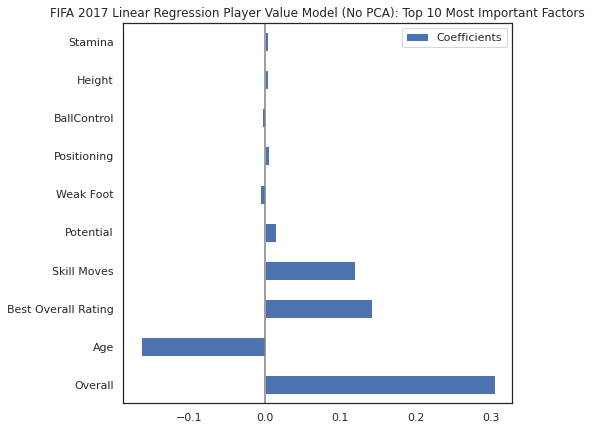

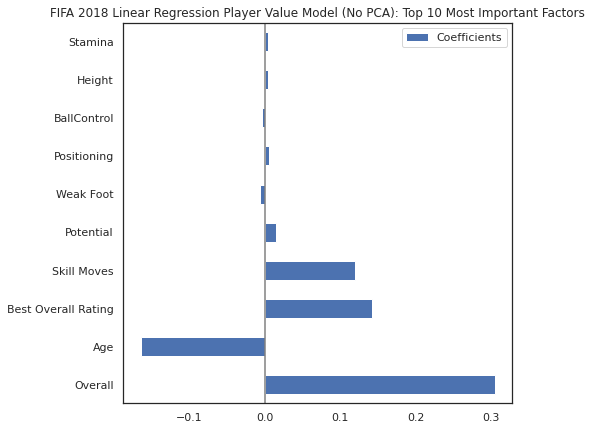

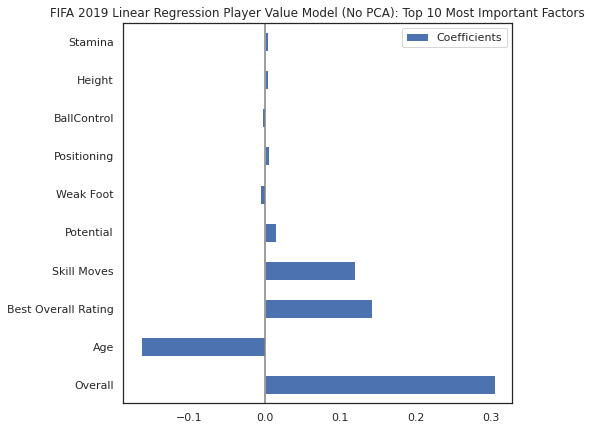

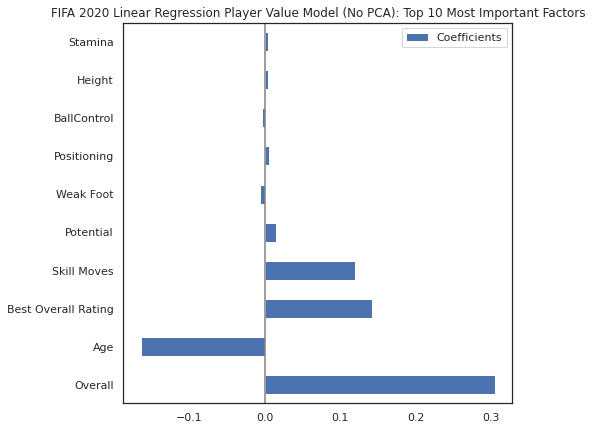

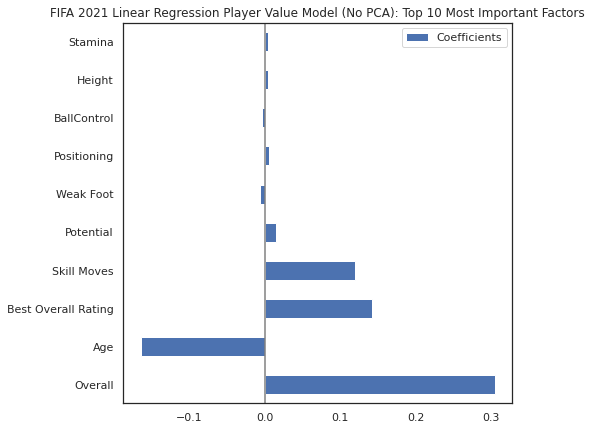

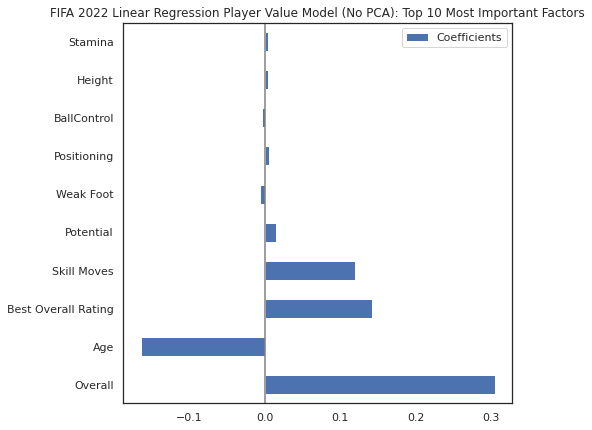

In [ ]:
#Finding most most important components in the model WITHOUT PCA
import matplotlib.pyplot as plt
import functools


def compare(item1, item2):
  if abs(item1[0]) < abs(item2[0]):
    return -1
  elif abs(item1[0]) > abs(item2[0]):
    return 1
  else:
    return 0


for i in range(len(fifa_df_list)):
    training_dfs = fifa_df_list[:i]
    x_train, y_train = get_features_labels(training_dfs)
    reg = LinearRegression().fit(x_train, y_train)

    coefficients = []
    for f in reg.coef_:
      for j in f:
        coefficients.append(j)


    cols = []
    for k in x_train.columns:
      cols.append(k)


    coefficients_sorted, cols_sorted = (list(t) for t in zip(*sorted(zip(coefficients, cols), key=functools.cmp_to_key(compare), reverse=True)))

    coefs = pd.DataFrame(
      coefficients_sorted[0:10],
      columns=['Coefficients'], index=cols_sorted[0:10]
    )

    coefs.plot(kind='barh', figsize=(9, 7))
    plt.title('FIFA {year} Linear Regression Player Value Model (No PCA): Top 10 Most Important Factors'.format(year = i + 2017))
    plt.axvline(x=0, color='.5')
    plt.subplots_adjust(left=.3)

##3.5 Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
# print out best parameters
def print_best_params(results):
    print('best_params: {}\n'.format(results.best_params_))
    return results.best_params_

In [ ]:
rfc = RandomForestClassifier()
param_grid = { 
    'n_estimators': [n for n in range(100, 301, 100)],
    'max_depth' : [n for n in range(10, 31, 10)]
}
gs = GridSearchCV(estimator=rfc, param_grid=param_grid)
rf_cv = gs.fit(x_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:681: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:681: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:681: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:681: DataConversionWarning: A column-vector y was passed when a 

In [ ]:
best_params = print_best_params(rf_cv)

best_params: {'max_depth': 20, 'n_estimators': 200}



In [ ]:
clf = RandomForestClassifier(max_depth=best_params['max_depth'], n_estimators=best_params['n_estimators'])
clf.fit(x_train, y_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


RandomForestClassifier(max_depth=20, n_estimators=200)

In [ ]:
y_pred = clf.predict(x_test)
test_accuracy = accuracy_score(y_test, y_pred)
print("Accuracy for Random Forest Model: {}".format(test_accuracy))

Accuracy for Random Forest Model: 0.7576053945539712


## 3.6 Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

# Generate list of regression models, each subsequent model adds on a new year
clfs = []
for i in range(len(fifa_df_list)):
  if i == 0:
    continue
  scl = StandardScaler()

  training_dfs = fifa_df_list[:i]
  x_train, y_train = get_features_labels(training_dfs)

  pca = PCA(n_components=components)
  clf = LogisticRegression(max_iter=100, penalty='l2')
  pipe = Pipeline(steps=[('Scale',scl),('PCA',pca),('LogReg',clf)])
  clfs.append(pipe.fit(x_train, y_train))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example

In [ ]:
for i, (x_test,y_test) in enumerate(features_labels_list):
  if i == 0:
    continue
  print("Accuracy for FIFA {} (based on previous years): ".format(17+i), clfs[i-1].score(x_test, y_test))

Accuracy for FIFA 18 (based on previous years):  0.6290490513651087
Accuracy for FIFA 19 (based on previous years):  0.6357539315448658
Accuracy for FIFA 20 (based on previous years):  0.6818243426402819
Accuracy for FIFA 21 (based on previous years):  0.6825070639609555
Accuracy for FIFA 22 (based on previous years):  0.49523062851169475


In [ ]:
from sklearn.model_selection import train_test_split
features, labels = get_features_labels(fifa_df_list)
x_train, x_test, y_train, y_test = train_test_split(features, 
                                                    labels, 
                                                    test_size = 0.20, 
                                                    train_size = 0.80, 
                                                    random_state = 42)

In [ ]:
pca = PCA(n_components=components)
clf = LogisticRegression(max_iter=100, penalty='l2')
pipe = Pipeline(steps=[('Scale',StandardScaler()),('PCA',pca),('LogReg',clf)])
pipe = pipe.fit(x_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


In [ ]:
print("Accuracy for Logistic Regression (based on all years): ", pipe.score(x_test, y_test))

Accuracy for Logistic Regression (based on all years):  0.6616564575075925


#Section 4: Unused Code

##4.1 Scraping from Sofifa

In [ ]:
#Get wage, value data from sofifa.com for 2017-2022
#Note that all wages/values are in Euros, so we remove the units.
#The wage is a PER WEEK STAT!!
#https://stackoverflow.com/questions/68896543/how-to-scrape-sofifa-website-positions-text-inside-of-span-beautiful-soup

year_url_dict = {2017 : "170099", 2018 : "180084", 2019 : "190075", 2020 : "200061", 2021 : "210064", 2022 : "220015"}

def get_data(year, offset):
    url = "https://sofifa.com/?r={}&offset={}".format(year_url_dict[year], str(offset * 60))
    soup = BeautifulSoup(requests.get(url).content, "html.parser")

    rv = []
    for row in soup.select("tbody tr"):
        id_ = row.select_one("img[id]")["id"]
        wage = row.select_one(".col-wg").get_text(strip=True)
        transfer_value = row.select_one(".col-vl").get_text(strip=True)
        rv.append(
            [
                id_,
                wage[1:],
            transfer_value[1:]
            ])
    return rv


data_2017, data_2018, data_2019, data_2020, data_2021, data_2022 = [], [], [], [], [], []
data_dict = [data_2017, data_2018, data_2019, data_2020, data_2021, data_2022]
for i in range(0,6):
  for offset in range(0, 3):  # <--- increase offset here
      print("Year {}, Offset {}...".format(2017 + i, offset))
      data_dict[i].extend(get_data(2017 + i, offset))

# Take the data from above and convert into 6 pandas dataframes
# Drop duplicate id columns so we don't have multiple players in each df
df_list = []
for i in range(0, 5):
  df_list.append(pd.DataFrame(
    data_dict[i],
    columns=["id", "wage", "transfer_value"]))
  df_list[i]["id"] = pd.to_numeric(df_list[i]["id"])
  df_list[i] = df_list[i].drop_duplicates(subset=['id'])

# Join the data we scraped into the existing dataframes. 
# Named the list of dataframes fifa_df_list
fifa_df_list = [fifa17_df, fifa18_df, fifa19_df, fifa20_df, fifa21_df, fifa22_df]

for i in range (0, 5):
  fifa_df = fifa_df_list[i]
  to_join_df = df_list[i]
  fifa_df_list[i] = fifa_df.merge(to_join_df, left_on="ID", right_on="id", how="inner")
